# Setup

In [ ]:
# Standard libraries
import io
import csv
import re
import random
import string
import time
from IPython.display import display, clear_output, Audio

# External libraries
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import seaborn as sns
from bokeh.io import output_notebook, show
from bokeh.models import Circle, MultiLine, Legend, LegendItem
from bokeh.models.graphs import NodesAndLinkedEdges
from bokeh.palettes import Blues8, Turbo256, Blues256, Greens256, Oranges256
from bokeh.plotting import figure, from_networkx
import plotly.graph_objects as go
import plotly.express as px
from scipy.stats import spearmanr

# NLTK
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import RSLPStemmer, WordNetLemmatizer
nltk.download('stopwords')
nltk.download('rslp')
nltk.download('wordnet')

#sklearn
from sklearn.feature_extraction.text import CountVectorizer

# Spacy
import spacy
!python -m spacy download pt_core_news_sm
nlp = spacy.load("pt_core_news_sm")

# Stanza and Deplacy
!pip install deplacy stanza
import stanza
import deplacy

# Wordcloud
from wordcloud import WordCloud

# Graphviz
import graphviz

# Google Colab specific
from google.colab import files
#leia
!pip install leia-br
from LeIA import SentimentIntensityAnalyzer

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package rslp to /root/nltk_data...
[nltk_data]   Unzipping stemmers/rslp.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


2023-09-24 05:11:48.103968: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 21.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('pt_core_news_sm')
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.2/865.2 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 358.9/358.9 kB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.0/130.0 kB 2.4 MB/s eta 0:00:00


# NetworkPlotter3D

In [ ]:
class NetworkPlotter3D:
    def __init__(self, G, palette, communities, layout_function):
        self.G = G
        self.palette = palette
        self.communities = communities
        self.layout_function = layout_function
        self.pos = None
        self.edge_x = []
        self.edge_y = []
        self.edge_z = []
        self.node_x = []
        self.node_y = []
        self.node_z = []
        self.node_colors = []
        self.node_sizes = []
        self.hover_texts = []
        self._prepare_data()

    def _prepare_data(self):
        # Convert node names in the communities to integers if they aren't
        if not all(isinstance(node, int) for node in self.G.nodes()):
            mapping = {node: int(node) for node in self.G.nodes()}
            self.G = nx.relabel_nodes(self.G, mapping)

        # Convert node names in the communities to integers
        self.communities = [set(map(int, community)) for community in self.communities]

        # Compute modularity colors
        self._compute_modularity_colors()

        # Compute node metrics
        self._compute_node_metrics()

        # Compute node sizes based on eigenvector centrality
        self.node_sizes = self._compute_node_sizes()

        # Compute 3D positions
        self.pos = self.layout_function(self.G, dim=3, communities=self.communities)

        # Extract edge positions
        self._extract_edge_positions()

        # Extract node positions and hover texts
        self._extract_node_positions_and_hover_texts()

    def _compute_modularity_colors(self):
        modularity_color = {}
        for community_number, community in enumerate(self.communities):
            for name in community:
                modularity_color[name] = self.palette[community_number % len(self.palette)]
        # Ensure all nodes have a color
        default_color = "black"  # Default color for nodes not in any community
        for node in self.G.nodes():
            if node not in modularity_color:
                modularity_color[node] = default_color
        nx.set_node_attributes(self.G, modularity_color, 'modularity_color')
        self.node_colors = [modularity_color[node] for node in self.G.nodes()]


    def _compute_node_metrics(self):
        # Compute degree for each node
        degrees = dict(self.G.degree())
        nx.set_node_attributes(self.G, degrees, 'degree')

        # Compute eigenvector centrality for each node
        eigenvector_centrality = nx.eigenvector_centrality(self.G)
        nx.set_node_attributes(self.G, eigenvector_centrality, 'eigenvector_centrality')

        # Compute followers (in-degree) and following (out-degree) for each node
        followers = dict(self.G.in_degree())
        following = dict(self.G.out_degree())
        nx.set_node_attributes(self.G, followers, 'followers')
        nx.set_node_attributes(self.G, following, 'following')

    def _compute_node_sizes(self):
        centrality_values = [self.G.nodes[node]['eigenvector_centrality'] for node in self.G.nodes()]
        max_centrality = max(centrality_values)
        min_centrality = min(centrality_values)
        size_bounds = {'desired': {'lower': 5, 'upper': 50}, 'actual': {'lower': min_centrality, 'upper': max_centrality}}
        sizes = [size_bounds['desired']['lower'] + (x - size_bounds['actual']['lower']) * (size_bounds['desired']['upper'] - size_bounds['desired']['lower']) / (size_bounds['actual']['upper'] - size_bounds['actual']['lower']) for x in centrality_values]
        return sizes

    def _extract_edge_positions(self):
        for edge in self.G.edges():
            x0, y0, z0 = self.pos[edge[0]]
            x1, y1, z1 = self.pos[edge[1]]
            self.edge_x.extend([x0, x1, None])
            self.edge_y.extend([y0, y1, None])
            self.edge_z.extend([z0, z1, None])

    def _extract_node_positions_and_hover_texts(self):
        for node in self.G.nodes():
            self.node_x.append(self.pos[node][0])
            self.node_y.append(self.pos[node][1])
            self.node_z.append(self.pos[node][2])

            node_id_text = f"Node ID: {node}"
            community_text = f"Community: {self.G.nodes[node].get('modularity_class', 'N/A')}"
            degree_text = f"Degree: {self.G.nodes[node].get('degree', 'N/A')}"
            eigenvector_text = f"Eigenvector Centrality: {self.G.nodes[node].get('eigenvector_centrality', 'N/A'):.4f}"  # Rounded to 4 decimal places
            followers_text = f"Followers: {self.G.nodes[node].get('followers', 'N/A')}"
            following_text = f"Following: {self.G.nodes[node].get('following', 'N/A')}"

            hover_info = f"{node_id_text}<br>{community_text}<br>{degree_text}<br>{eigenvector_text}<br>{followers_text}<br>{following_text}"
            self.hover_texts.append(hover_info)

    def plot(self, title="Network Plot"):
        edge_trace = go.Scatter3d(x=self.edge_x, y=self.edge_y, z=self.edge_z, mode='lines', line=dict(width=0.5, color='gray'), showlegend=False, hoverinfo='none')
        node_trace = go.Scatter3d(x=self.node_x, y=self.node_y, z=self.node_z, mode='markers', marker=dict(size=self.node_sizes, color=self.node_colors, opacity=0.8), showlegend=False, text=self.hover_texts, hoverinfo='text')
        fig = go.Figure(data=[edge_trace, node_trace])
        for community_number, community_color in enumerate(palette):
          fig.add_trace(go.Scatter3d(x=[None], y=[None], z=[None], mode='markers', marker=dict(size=10, color=community_color), name=f"Community {community_number + 1}"))
        fig.update_layout(title={
            'text': title,
            'y': 0.9,
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font': {
                'size': 20,
                'color': 'black'
            }
        },
        scene=dict(aspectmode='data',
                   xaxis=dict(nticks=10, showspikes=False, showbackground=False, showline=False, zeroline=False, showgrid=False, showticklabels=False),
                   yaxis=dict(nticks=10, showspikes=False, showbackground=False, showline=False, zeroline=False, showgrid=False, showticklabels=False),
                   zaxis=dict(nticks=10, showspikes=False, showbackground=False, showline=False, zeroline=False, showgrid=False, showticklabels=False)),
                  margin=dict(t=20, b=20, r=20, l=20),
                  height=800)
        fig.show()

In [ ]:
def kamada_kawai_layout_strategy(G, **kwargs):
    dim = kwargs.get('dim', 2)
    return nx.kamada_kawai_layout(G, dim=dim)
#######
def get_palette_subset(palette, num_colors):
    if num_colors > len(palette):
        raise ValueError("Number of colors requested exceeds palette size.")

    step = len(palette) // num_colors
    start = random.randint(0, step)

    return palette[start::step][:num_colors]
##########
# Example usage:
subset_palette = get_palette_subset(Turbo256, 50)
#print(subset_palette)
###
def custom_3d_layout(G, **kwargs):
    communities = kwargs.get('communities', [])
    pos_initial = nx.kamada_kawai_layout(G, dim=3)

    # Calculate eigenvector centrality
    centrality = nx.eigenvector_centrality_numpy(G)

    new_positions = {}

    # Position community nodes
    for community in communities:
        # Identify the most influential user in the community
        influential_user = max(community, key=lambda x: centrality[x])
        new_positions[influential_user] = pos_initial[influential_user]

        # Position other community members around the influential user
        for member in community:
            if member != influential_user:
                # Calculate vector from influential user to member
                vector = np.array(pos_initial[member]) - np.array(pos_initial[influential_user])
                # Scale the vector to bring the member closer to the influential user
                vector *= 0.5
                new_positions[member] = tuple(np.array(pos_initial[influential_user]) + vector)

    # Position non-community nodes
    for node in G.nodes():
        if node not in new_positions:
            neighbors = list(G.neighbors(node))
            if neighbors:
                avg_position = np.mean([np.array(pos_initial[neighbor]) for neighbor in neighbors], axis=0)
                new_positions[node] = tuple(avg_position)
            else:
                # If the node has no neighbors, keep its initial position
                new_positions[node] = pos_initial[node]

    return new_positions


# Utilities

In [ ]:
def calculate_time_taken(func):
    def wrapper(*args, **kwargs):
        start_time = time.time()
        result = func(*args, **kwargs)
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"Time taken: {elapsed_time:.2f} seconds")
        playSound()
        return result
    return wrapper
###
def find_and_print_user_by_id(df, user_id):
    user_row = df[df['colab_user_id'] == user_id]
    if not user_row.empty:
        print(user_row)
    else:
        print(f"No row found with colab_user_id {user_id}")
###
# Play a sound
def playSound():
    sound_file = 'https://freesound.org/data/previews/80/80921_1022651-lq.mp3'
    display(Audio(sound_file, autoplay=True))
####

# File URLs

In [ ]:
url_nodes = "https://drive.google.com/uc?id=1C04iiMkjoWStAbL19RcIAAE2uOnITejr&export=download"
#url_edges = "https://drive.google.com/uc?id=1qgDnfspXejVCuRaqUUFLIxYsMsbvZBaH&export=download" #full graph
#url_edges = "https://drive.google.com/uc?id=1cAbt0F9Gb0_06wephtLi7RlI8qYTWWMW&export=download" # interactions 3 cidades
url_edges = "https://drive.google.com/uc?id=1skMWv0IDbMZ-Gl3f2BzCVScmK6cZPakd&export=download" # gephi
url_selected_events = "https://drive.google.com/uc?id=1LE6KriDSpUZaeDLA3S00PrvRlqcK8po5&export=download"
url_events = "https://drive.google.com/uc?id=1ve5bdHhtE0Kl4Pci8A6l6XIikkbl1Bwm&export=download"
url_swearwords = "https://drive.google.com/uc?id=1ZxF53adijiO_Q4dtVq25W1-o5w8aOR93&export=download"
url_emojis = "https://drive.google.com/uc?id=1nNx8J4smTg8NkXfD4Y4pfg-03P9uRDsO&export=download"

# Load Nodes File

In [ ]:
nodes = pd.read_csv(url_nodes, sep=',', decimal='.', header=0)
nodes

,colab_user_id,birth_date,city,education,gender,idade,race
0,323968,1969-08-11,Santo André,bachelor,female,54.0,white
1,222051,1961-02-12,Santo André,primary,male,62.0,NaN
2,440321,1995-12-16,Niterói,secondary,female,28.0,brown
3,355872,1996-05-02,Niterói,unfinished_bachelor,female,27.0,white
4,427856,1960-05-04,Niterói,bachelor,male,63.0,white
...,...,...,...,...,...,...,...
57796,702775,1980-07-16,São Gonçalo,NaN,male,43.0,NaN
57797,362855,1983-01-07,Santo André,NaN,male,40.0,NaN
57798,947835,NaN,Serra,NaN,male,NaN,NaN
57799,694585,1974-10-20,São Gonçalo,secondary,male,49.0,brown


# Load Edges File

In [ ]:
edges = pd.read_csv(url_edges, sep=',', decimal='.', header=0)
edges

,source,target
0,113450,162519
1,113450,118923
2,113450,40367
3,113450,123242
4,113450,39850
...,...,...
25780,248233,58898
25781,248233,60405
25782,321685,284896
25783,321685,291751


# Load Selected Events

In [ ]:
selected_events = pd.read_csv(url_selected_events, sep=',', decimal='.', header=0)
selected_events

,event_id,colab_user_id,description,status,created_at,event_type_id,event_type_name,city,lat,lon,deleted_at,city_id
0,398893,689995,cratera se formando junto ao meio fio da calça...,ATENDIMENTO,2022-08-22T12:32:45-0300,9761,Buraco nas vias,Maceió,-9.674018,-35.761009,NaN,69
1,445735,505906,poste com lâmpada queimada a varios meses.\n\n...,RECUSADO,2023-02-24T21:13:04-0300,11421,Lâmpada apagada à noite,São Gonçalo,-22.850234,-43.068530,NaN,3663
2,442170,431354,"Poste sem iluminação pública, desde a semana d...",FECHADO,2023-02-15T21:59:35-0300,1689,Lâmpada apagada à noite,Niterói,-22.892010,-43.091803,NaN,3638
3,420493,690592,venho por meio desta solicitação um pedido de...,FECHADO,2022-12-01T00:16:37-0300,9955,Descarte irregular de lixo,Mesquita,-22.797534,-43.441498,NaN,3633
4,406621,717058,Solicito me humilhando mais uma vez que troque...,FECHADO,2022-09-27T21:37:47-0300,11421,Lâmpada apagada à noite,São Gonçalo,-22.840175,-43.065324,NaN,3663
...,...,...,...,...,...,...,...,...,...,...,...,...
32916,318142,133757,Lampada apagada a noite,FECHADO,2021-10-06T21:06:33-0300,5645,Lâmpada apagada à noite,Novo Hamburgo,-29.722039,-51.143741,NaN,4204
32917,334283,91232,Todos os dias há o mesmo problema. Motoristas ...,FECHADO,2021-12-15T01:28:35-0300,5585,Ponto de infração de trânsito recorrente,Novo Hamburgo,-29.718532,-51.128758,NaN,4204
32918,435094,723243,"Um poste com ""4 pétalas"" lâmpadas LEDs em curt...",FECHADO,2023-01-29T07:46:32-0300,11680,Lâmpada apagada à noite,Diadema,-23.679597,-46.596144,NaN,4934
32919,453375,203800,Fio e cabo de aço pendurados. Perigo para pede...,FECHADO,2023-03-14T19:42:10-0300,1687,Fiação irregular,Niterói,-22.898819,-43.094667,NaN,3638


# Load All Events

In [ ]:
events = pd.read_csv(url_events, sep=',', decimal='.', header=0)
events = events.rename(columns={'id': 'event_id', 'user_id': 'colab_user_id', 'lng': 'lon'})
events

,event_id,colab_user_id,description,status,created_at,event_type_id,event_type_name,lat,lon
0,5,623,Carro estacionado na calçada em Edelson Cabele...,RECUSADO,2013-03-06 18:59,7575,Ponto de infração de trânsito recorrente,-8.046207,-34.895451
1,8,68,Estacionamento da própria Prefeitura próximo a...,RECUSADO,2013-03-07 19:03,7575,Ponto de infração de trânsito recorrente,-8.126271,-34.903793
2,9,166,"Na esquina com a rua da Aurora, calçada da Com...",RECUSADO,2013-03-07 21:56,7546,Calçada irregular,-8.047074,-34.877379
3,10,164,Todos os dias a concessionária Auto Mar estaci...,RECUSADO,2013-03-08 00:51,7575,Ponto de infração de trânsito recorrente,-8.097561,-34.885641
4,11,733,"Diariamente, até mesmo em frente a prédio da p...",RECUSADO,2013-03-08 02:10,7575,Ponto de infração de trânsito recorrente,-8.043143,-34.891382
...,...,...,...,...,...,...,...,...,...
329689,377001,179101,"Esgoto escorrendo da caixa pluvial, situação c...",ABERTO,2022-05-23 17:54,1742,Vazamento de esgoto,-22.930053,-43.022251
329690,377002,664235,"Olá, prezados, solicito por favor a fixação de...",NOVO,2022-05-23 18:02,11064,Manutenção Predial Geral,-20.501867,-54.613311
329691,377003,681506,Limpeza em toda extensão da Rua José Bonifáci...,NOVO,2022-05-23 18:05,9955,Descarte irregular de lixo,-22.783890,-43.410561
329692,377004,404396,árvores na rua caindo sobre as casas Ponto ...,NOVO,2022-05-23 18:05,1699,Poda de árvore,-22.891748,-43.066333


# Collate unique user ids

In [ ]:
unique_colab_user_ids = pd.concat([edges['source'], edges['target']]).unique()
print(unique_colab_user_ids)

[113450 150053 186310 ... 204883 429922 467302]


# Filter events by unique user ids

In [ ]:
filtered_events = events[events['colab_user_id'].isin(unique_colab_user_ids)]
# Filter the events_selected_users DataFrame
filtered_events_selected_users = selected_events[selected_events['colab_user_id'].isin(unique_colab_user_ids)]

# Merge the filtered results of events and events_selected_users DataFrames
merged_events = pd.concat([filtered_events, filtered_events_selected_users], ignore_index=True)

merged_events

,event_id,colab_user_id,description,status,created_at,event_type_id,event_type_name,lat,lon,city,deleted_at,city_id
0,41,86,Árvore bloqueando a calçada,FECHADO,2013-03-17 16:55,7574,Poda de árvore,-8.037968,-34.876409,NaN,NaN,NaN
1,54,2,Barraca no meio da calçada na Marquês de Olind...,RECUSADO,2013-03-21 14:11,7558,Ocupação irregular de área pública,-8.063467,-34.872855,NaN,NaN,NaN
2,58,86,Utilização da calçada para estacionamento. Pad...,RECUSADO,2013-03-23 18:59,7558,Ocupação irregular de área pública,-8.105268,-34.887529,NaN,NaN,NaN
3,582,86,"Árvore batendo na fiação, que já está toda bag...",FECHADO,2013-04-22 19:13,3942,Poda de árvore,-23.601828,-46.658975,NaN,NaN,NaN
4,918,86,Entulho na calçada e o pedestre tem que passar...,FECHADO,2013-05-07 22:50,3938,Entulho na calçada/via pública,-23.604105,-46.669592,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
132841,258206,293209,Vizinho fez uma reforma na casa e simplesmente...,NOVO,2021-01-02T15:59:14-0300,9,Entulho na calçada/via pública,-23.629147,-46.493427,Santo André,2021-01-02T16:41:43-0300,5317.0
132842,274342,319241,"Porque não coloca GCM, uma Base nessa praça? ...",ABERTO,2021-03-13T02:42:58-0300,56,Ponto de exploração sexual de menores,-23.647119,-46.561029,Santo André,2021-07-18T01:58:17-0300,5317.0
132843,285040,197268,"Olá, no telhado do imóvel localizado na avenid...",NOVO,2021-05-02T23:34:19-0300,54,Infestação animais perigosos,-22.780779,-43.428578,Mesquita,2021-05-02T23:34:49-0300,3633.0
132844,284833,95084,"Boa tarde, no sambaqui de Balneario arroio do ...",NOVO,2021-05-01T15:37:59-0300,46,Mato alto,-28.986578,-49.415328,Balneário Arroio do Silva,NaN,4438.0


In [ ]:
print(len(merged_events))
merged_events.to_csv("events_3_cidades.csv")

132846


# Sentiment Analysis Code

In [ ]:
# Inicializar os stemmers e lemmatizers
stemmer = RSLPStemmer()
lemmatizer = WordNetLemmatizer()
nlp_stanza = stanza.Pipeline("pt")

# Carregar o arquivo CSV com o dicionário Oplexicon
dict_oplexicon = {}
csvfile = pd.read_csv("https://drive.google.com/uc?id=1iUCi4LRaOnHpcthw86KpuYqNzFKlcpZn&export=download", low_memory=False)
for index, row in csvfile.iterrows():
  palavra = row[0]
  polaridade = row[2]
  dict_oplexicon[palavra] = polaridade

# Carregar o arquivo CSV com o dicionário Unilex
dict_unilex = {}
csvfile = pd.read_csv("https://drive.google.com/uc?id=1AViTEwjiwCwh2yoiCeNd-hjx2ysN5xxO&export=download", low_memory=False)
for index, row in csvfile.iterrows():
  palavra = row[0]
  polaridade = row[1]
  dict_unilex[palavra] = polaridade

# Carregar o arquivo CSV com o dicionário WordNetAffectBr
dict_wordnetaffectbr = {}
csvfile = pd.read_csv("https://drive.google.com/uc?id=18q63AB7uSVIyRMENi4Dgx9Kchn-yv_pe&export=download", low_memory=False)
for index, row in csvfile.iterrows():
  palavra = row[0]
  polaridade = row[1]
  dict_wordnetaffectbr[palavra] = polaridade
##

INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Loading these models for language: pt (Portuguese):
| Processor    | Package         |
----------------------------------
| tokenize     | bosque          |
| mwt          | bosque          |
| pos          | bosque_charlm   |
| lemma        | bosque_nocharlm |
| constituency | cintil_charlm   |
| depparse     | bosque_charlm   |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Loading: pos
INFO:stanza:Loading: lemma
INFO:stanza:Loading: constituency
INFO:stanza:Loading: depparse
INFO:stanza:Done loading processors!


In [ ]:
##STOPWORDS
# Lista de stopwords padrão em português
stopwords_pt = stopwords.words('portuguese')

# Suas stopwords específicas
custom_stopwords = ["rua", "pois"]

# Combinar as duas listas
all_stopwords = stopwords_pt + custom_stopwords
print(all_stopwords)

['a', 'à', 'ao', 'aos', 'aquela', 'aquelas', 'aquele', 'aqueles', 'aquilo', 'as', 'às', 'até', 'com', 'como', 'da', 'das', 'de', 'dela', 'delas', 'dele', 'deles', 'depois', 'do', 'dos', 'e', 'é', 'ela', 'elas', 'ele', 'eles', 'em', 'entre', 'era', 'eram', 'éramos', 'essa', 'essas', 'esse', 'esses', 'esta', 'está', 'estamos', 'estão', 'estar', 'estas', 'estava', 'estavam', 'estávamos', 'este', 'esteja', 'estejam', 'estejamos', 'estes', 'esteve', 'estive', 'estivemos', 'estiver', 'estivera', 'estiveram', 'estivéramos', 'estiverem', 'estivermos', 'estivesse', 'estivessem', 'estivéssemos', 'estou', 'eu', 'foi', 'fomos', 'for', 'fora', 'foram', 'fôramos', 'forem', 'formos', 'fosse', 'fossem', 'fôssemos', 'fui', 'há', 'haja', 'hajam', 'hajamos', 'hão', 'havemos', 'haver', 'hei', 'houve', 'houvemos', 'houver', 'houvera', 'houverá', 'houveram', 'houvéramos', 'houverão', 'houverei', 'houverem', 'houveremos', 'houveria', 'houveriam', 'houveríamos', 'houvermos', 'houvesse', 'houvessem', 'houvésse

In [ ]:
# Função para exibir o mapa sintático da frase utilizando Stanza e Deplacy
def exibirMapaSintatico(frase):
  doc = nlp_stanza(frase)
  deplacy.render(doc)
  graphviz.Source(deplacy.dot(doc))

# Função para exibir a distribuição de palavras e nuvem de palavras
def visualizarDistribuicaoPalavras(collection, top):
  cv = CountVectorizer(stop_words=all_stopwords)
  words = cv.fit_transform(collection)
  sum_words = words.sum(axis=0)

  words_freq = [(word, sum_words[0, i]) for word, i in cv.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)

  frequency = pd.DataFrame(words_freq, columns=['word', 'freq'])

  frequency.head(top).plot(x='word', y='freq', kind='bar', figsize=(20, 7), color='blue')
  wordcloud = WordCloud(background_color='white', width=1000, height=1000).generate_from_frequencies(dict(words_freq))
  plt.figure(figsize=(20, 8))
  plt.imshow(wordcloud)
  plt.title("WordCloud", fontsize=22)
  plt.show()

# Função de pré-processamento do texto
def anonimizar(texto):
    doc = nlp(texto)

    # Anonimizar nomes
    for ent in doc.ents:
        if ent.label_ == "PER":
            texto = texto.replace(ent.text, "|_NOME_|")
        elif ent.label_ == "ORG":
            texto = texto.replace(ent.text, "|_ORG_|")

    # Anonimizar e-mails
    email_pattern = r"[a-zA-Z0-9._%+-]+@[a-zA-Z0-9.-]+\.[a-zA-Z]{2,3}"
    texto = re.sub(email_pattern, "|_EMAIL_|", texto)

    # Anonimizar números de telefone (formatos comuns)
    phone_pattern = r"(\+\d{1,3}[-.\s]?)?\(?\d{1,4}\)?[-.\s]?\d{1,4}[-.\s]?\d{4,6}"
    texto = re.sub(phone_pattern, "|_TELEFONE_|", texto)

    return texto

def preprocessamento(texto):
    texto = anonimizar(texto)  # Anonimizar o texto completo
    texto_lower = str(texto).lower()
    documento = nlp(texto_lower)
    lista = [token.text for token in documento]

    # Lemmatization
    lista = [lemmatizer.lemmatize(token) for token in lista]

    lista = [palavra for palavra in lista if palavra not in all_stopwords and palavra not in string.punctuation and not palavra.isdigit()]
    return lista
# Função para obter a polaridade da frase usando um dicionário
def obterPolaridade(frase, dicionario, verbose=False):
  if(verbose): print("obterPolaridade: ", frase)
  if(verbose): print("BREAKDOWN LEXICON")
  if(verbose): printLexiconPhrase(frase)
  frase_processada = preprocessamento(frase)
  if(verbose): print("frase_processada: ", frase_processada)
  frase_polaridade = [float(dicionario.get(palavra, 0)) for palavra in frase_processada]
  if(verbose): print("frase_polaridade: ", frase_polaridade)
  score = sum(frase_polaridade)
  if(verbose): print("score: ", score)

  return score

# Função para analisar o sentimento da frase usando diferentes dicionários
def analisarSentimento(frase, dicionarios):
  scores = [obterPolaridade(frase, dicionario) for dicionario in dicionarios]
  return scores

# Função para imprimir os valores associados a cada palavra da frase
def printLexiconPhrase(frase):
  phrases = {}
  for palavra in frase.lower().translate(str.maketrans('', '', string.punctuation)).split(" "):
    phrases[palavra.strip()] = lexicon.get(palavra.strip(), None)
  for palavra, valor in phrases.items():
    print(palavra, ": ", valor)
# Função para criar o conjunto de dados a partir dos eventos do Colab
def criarDataset(colab_events):
  dataset = colab_events.drop(columns=['status', 'created_at', 'event_type_name'])
  return dataset
# noralizar o lexicon
def normalize_lexicon(lexicon):
    """Normalizes the lexicon's values such that 0 remains unchanged,
    the most positive value becomes 1, and the most negative value becomes -1."""

    # Separate positive, negative, and neutral values
    positive_values = [v for v in lexicon.values() if v > 0]
    negative_values = [v for v in lexicon.values() if v < 0]

    # Find the maximum positive and minimum negative values for normalization
    max_positive = max(positive_values) if positive_values else 1
    min_negative = min(negative_values) if negative_values else -1

    # Normalize the lexicon values
    for word, value in lexicon.items():
        if value > 0:
            lexicon[word] = value / max_positive
        elif value < 0:
            lexicon[word] = value / abs(min_negative)  # Ensures normalization to [-1, 0]

    return lexicon
####

In [ ]:
# Adicionar palavras extras e corrigir valores de palavras no dicionário lexicon
lexicon = dict_oplexicon.copy()
lexicon.update(dict_unilex)
lexicon.update(dict_wordnetaffectbr)

# Testes rápidos

In [ ]:
frase = "João ama esse app! 💖 meu email é guinetik@gmail.com. Meu telefone é o 81 981323908. A PSDB ta trabalhando"
print("Polaridade da frase '", frase, "':", obterPolaridade(frase, lexicon, True))

obterPolaridade:  João ama esse app! 💖 meu email é guinetik@gmail.com. Meu telefone é o 81 981323908. A PSDB ta trabalhando
BREAKDOWN LEXICON
joão :  None
ama :  None
esse :  None
app :  -1
💖 :  None
meu :  None
email :  None
é :  None
guinetikgmailcom :  None
telefone :  None
o :  None
81 :  None
981323908 :  None
a :  None
psdb :  64
ta :  -10
trabalhando :  None
frase_processada:  ['|_nome_|', 'ama', 'app', '💖', 'email', '|_email_|', 'telefone', '|_telefone_|', '|_org_|', 'ta', 'trabalhando']
frase_polaridade:  [0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -10.0, 0.0]
score:  -11.0
Polaridade da frase ' João ama esse app! 💖 meu email é guinetik@gmail.com. Meu telefone é o 81 981323908. A PSDB ta trabalhando ': -11.0


In [ ]:
lexicon=normalize_lexicon(lexicon)

In [ ]:
palavras_lexicon = { "ama":1, "colabora": 1, "rua": 1, "iptu": -1, "prefeito": -1, "prefeitos": -1, "irregulares": -1, "indesejadas": -1, "bastasse": -1, "pública": 1, "horrorosas": -1, "indigência": -1, "inadequados": -1, "pt": -1, "psdb": -1, "pdt": -1, "corrupção": -1, "varias": -1, "árvore": 1, "urgente": 1, "número": 1, "frente": 1, "façam": -1, "asfaltem": -1, "prefeitura": 0.5, "sofreu": -1, "extremamente": -1, "mal": -1, "dejetos": -1, "vistoria": -1, "responsabilidade": -1, "secretaria": -1, "providência": -1, "gargalhadas": -1, "barulho": -1, "botequim": -1, "colab": -1, "algazarra": -1, "descaso": -1, "deveria": -1, "providências": -1, "reclamação": -1, "irrespirável": -1, "recorrentes": -1, "irregularidade": -1, "irregularidades": -1, "trabalhando": 1, "trabalhado": 1, "transparente": 1, "resolver": 0.5, "problemas": 0.5, "obstáculos": -1, "abismo": -1, "descumprimento": -1, "solicito": 1, "limpeza": 1, "porcaria": -1, "brasil": 0, "PT": -1, "PMN" : -1, "ENEL": -1, "CISP": -1 }
## adicionando palavras customizadas ao lexicon
for palavra, valor in palavras_lexicon.items():
  lexicon[palavra] = valor
## adicionadno palavroes ao lexicon
swearwords = pd.read_csv(url_swearwords, sep=',', decimal='.', header=None)
for word in swearwords.iloc[:, 0]:
    lexicon[word] = -50 - (2*len(word))
### adicionando emojis ao lexicon
emoji_df = pd.read_csv(url_emojis, sep=',', decimal='.', header=None)
for index, row in emoji_df.iterrows():
    if index == 0:
        continue
    emoji = row[0]
    sentiment = int(row[1])  # Convert sentiment to integer
    lexicon[emoji] = sentiment
##

In [ ]:
# Testando a polaridade das frases de exemplo
frases_teste = [
    "Isso é culpa dos prefeitos que não ligam para a população",
    "Eu pago meu IPTU em dia é um absurdo isso acontecer",
    "Parabéns a prefeitura que tem trabalhado de uma forma transparente para resolver os problemas da cidade",
    "Fiação sem vergonha na Vila Olímpia. Fios caem até o chão, pondo em perigo a segurança do pedestre.",
    "Calçadão de Boa Viagem com várias depressões e buracos causados por infiltração de água",
    "O descumprimento da política nacional de mobilidade é evidente nessa intervenção feita na ponte Paulo Guerra. Não basta o resto da calçada da ponte estar esburacada e cheia de obstáculos, é preciso também abrir um abismo para o pedestre ter que ultrapassar. Essa alça construída para dar acesso ao Shopping Riomar é imoral e com certeza haverá atropelamentos, que chamarão de 'acidentes'. Não será acidente, será apenas o fruto de uma infraestrutura toda voltada para o fluxo de automóveis individuais em detrimento do pedestre em descumprimento a lei federal. Infelizmente o Ministério Público não intervém nesse caso. Ainda estamos muito longe de atingir a acessibilidade universal."
    "VEÍCULOS SOBRE AS CALÇADAS DIARIAMENTE E A PMN NÃO FAZ NADA - TENHO MAIS DE 100 RECLAMAÇÕES COMPROVADAS E NUNCA HOUVE OPERAÇÃO NO LOCAL."
]

for frase in frases_teste:
  print("Polaridade da frase '", frase, "':", obterPolaridade(frase, lexicon, True))
  print()

obterPolaridade:  Isso é culpa dos prefeitos que não ligam para a população
BREAKDOWN LEXICON
isso :  None
é :  None
culpa :  -0.005847953216374269
dos :  None
prefeitos :  -1
que :  None
não :  None
ligam :  None
para :  None
a :  None
população :  None
frase_processada:  ['culpa', 'prefeitos', 'ligam', 'população']
frase_polaridade:  [-0.005847953216374269, -1.0, 0.0, 0.0]
score:  -1.0058479532163742
Polaridade da frase ' Isso é culpa dos prefeitos que não ligam para a população ': -1.0058479532163742

obterPolaridade:  Eu pago meu IPTU em dia é um absurdo isso acontecer
BREAKDOWN LEXICON
eu :  None
pago :  -0.005847953216374269
meu :  None
iptu :  -1
em :  None
dia :  0.453125
é :  None
um :  None
absurdo :  -0.023391812865497075
isso :  None
acontecer :  -0.005847953216374269
frase_processada:  ['pago', '|_org_|', 'dia', 'absurdo', 'acontecer']
frase_polaridade:  [-0.005847953216374269, 0.0, 0.453125, -0.023391812865497075, -0.005847953216374269]
score:  0.4180372807017544
Polarida

# Run sentiment analysis on User's posts

In [ ]:
dataset = criarDataset(merged_events)
# Subsample the dataset (for quick tests)
#dataset = dataset.sample(n=1000, random_state=42)
@calculate_time_taken
def process_sentiment(dataset):
    # Calcular os scores das postagens usando o lexicon
    scores = []
    for index, row in dataset.iterrows():
        post = row[2]
        clear_output(wait=True)
        print(f"processing {index} of {len(dataset)}")
        if isinstance(post, str):
            score = obterPolaridade(post, lexicon, False)
        else:
            score = 0
        scores.append(score)

    dataset["score"] = scores
###
###process_sentiment(dataset)
###
@calculate_time_taken
def process_sentiment_with_leia(dataset):
    # Inicializar o SentimentIntensityAnalyzer
    s = SentimentIntensityAnalyzer()

    # Listas para armazenar os scores
    scores = []
    leia_neg = []
    leia_neu = []
    leia_pos = []
    leia_compound = []
    for idx, (index, row) in enumerate(dataset.iterrows()):
        post = row[2]
        percentage = ((idx + 1) / len(dataset)) * 100
        clear_output(wait=True)
        print(f"Processing {idx + 1} of {len(dataset)} ({percentage:.2f}%)")
        # método original de obter polaridade
        if isinstance(post, str):
            score = obterPolaridade(post, lexicon, False)
        else:
            score = 0
        # Adicionando o score ao array
        scores.append(round(score, 3))
        # Usando o LeIA para obter os scores de sentimento
        if isinstance(post, str):
            leia_scores = s.polarity_scores(anonimizar(post))
            leia_neg.append(leia_scores['neg'])
            leia_neu.append(leia_scores['neu'])
            leia_pos.append(leia_scores['pos'])
            leia_compound.append(leia_scores['compound'])
        else:
            leia_neg.append(0)
            leia_neu.append(0)
            leia_pos.append(0)
            leia_compound.append(0)

    # Adicionando os scores ao dataset
    dataset["score"] = scores
    dataset["leia_neg"] = leia_neg
    dataset["leia_neu"] = leia_neu
    dataset["leia_pos"] = leia_pos
    dataset["leia_compound"] = leia_compound

# Chamar a função
process_sentiment_with_leia(dataset)


Processing 132846 of 132846 (100.00%)
Time taken: 5173.54 seconds


# Dataset Cleanup and normalization

In [ ]:
columns_to_drop = ['city', 'deleted_at', 'city_id', 'compound_score']

# Filtrar apenas as colunas que realmente existem no DataFrame
columns_to_drop = [col for col in columns_to_drop if col in dataset.columns]

dataset.drop(columns_to_drop, axis=1, inplace=True)
dataset

,event_id,colab_user_id,description,event_type_id,lat,lon,score,leia_neg,leia_neu,leia_pos,leia_compound
0,41,86,Árvore bloqueando a calçada,7574,-8.037968,-34.876409,0.000,0.565,0.435,0.000,-0.3818
1,54,2,Barraca no meio da calçada na Marquês de Olind...,7558,-8.063467,-34.872855,0.268,0.153,0.794,0.053,-0.5514
2,58,86,Utilização da calçada para estacionamento. Pad...,7558,-8.105268,-34.887529,0.000,0.242,0.758,0.000,-0.1531
3,582,86,"Árvore batendo na fiação, que já está toda bag...",3942,-23.601828,-46.658975,0.000,0.000,1.000,0.000,0.0000
4,918,86,Entulho na calçada e o pedestre tem que passar...,3938,-23.604105,-46.669592,0.004,0.000,1.000,0.000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...
132841,258206,293209,Vizinho fez uma reforma na casa e simplesmente...,9,-23.629147,-46.493427,0.910,0.094,0.862,0.044,-0.3818
132842,274342,319241,"Porque não coloca GCM, uma Base nessa praça? ...",56,-23.647119,-46.561029,0.010,0.128,0.872,0.000,-0.2960
132843,285040,197268,"Olá, no telhado do imóvel localizado na avenid...",54,-22.780779,-43.428578,0.113,0.000,1.000,0.000,0.0000
132844,284833,95084,"Boa tarde, no sambaqui de Balneario arroio do ...",46,-28.986578,-49.415328,1.084,0.074,0.772,0.154,0.4019


In [ ]:
# Define a custom normalization function
# Separate positive and negative scores
positive_scores = dataset[dataset['score'] > 0]['score']
negative_scores = dataset[dataset['score'] < 0]['score']

# Define a custom normalization function for positive scores
def normalize_positive(score):
    return 0.1 + (score / positive_scores.max()) * 0.9

# Define a custom normalization function for negative scores
def normalize_negative(score):
    return -0.9 + (score / negative_scores.min()) * 0.1

@calculate_time_taken
def normalized_scores(ds):
  # Apply the custom normalization functions to their respective subsets
  ds.loc[ds['score'] > 0, 'normalized_score'] = round(positive_scores.apply(normalize_positive),3)
  ds.loc[ds['score'] < 0, 'normalized_score'] = round(negative_scores.apply(normalize_negative),3)
  ds.loc[ds['score'] == 0, 'normalized_score'] = 0  # Neutral score remains as 0
normalized_scores(dataset)
##
# Definir pesos
peso_original = 0.4
peso_leia = 0.6
# Calcular a métrica combinada
dataset['compound_score'] = round((dataset['normalized_score'] * peso_original) + (dataset['leia_compound'] * peso_leia),3)
# Print the result
dataset


Time taken: 33.26 seconds


,event_id,colab_user_id,description,event_type_id,lat,lon,score,leia_neg,leia_neu,leia_pos,leia_compound,normalized_score,compound_score
0,41,86,Árvore bloqueando a calçada,7574,-8.037968,-34.876409,0.000,0.565,0.435,0.000,-0.3818,0.000,-0.229
1,54,2,Barraca no meio da calçada na Marquês de Olind...,7558,-8.063467,-34.872855,0.268,0.153,0.794,0.053,-0.5514,0.103,-0.290
2,58,86,Utilização da calçada para estacionamento. Pad...,7558,-8.105268,-34.887529,0.000,0.242,0.758,0.000,-0.1531,0.000,-0.092
3,582,86,"Árvore batendo na fiação, que já está toda bag...",3942,-23.601828,-46.658975,0.000,0.000,1.000,0.000,0.0000,0.000,0.000
4,918,86,Entulho na calçada e o pedestre tem que passar...,3938,-23.604105,-46.669592,0.004,0.000,1.000,0.000,0.0000,0.100,0.040
...,...,...,...,...,...,...,...,...,...,...,...,...,...
132841,258206,293209,Vizinho fez uma reforma na casa e simplesmente...,9,-23.629147,-46.493427,0.910,0.094,0.862,0.044,-0.3818,0.110,-0.185
132842,274342,319241,"Porque não coloca GCM, uma Base nessa praça? ...",56,-23.647119,-46.561029,0.010,0.128,0.872,0.000,-0.2960,0.100,-0.138
132843,285040,197268,"Olá, no telhado do imóvel localizado na avenid...",54,-22.780779,-43.428578,0.113,0.000,1.000,0.000,0.0000,0.101,0.040
132844,284833,95084,"Boa tarde, no sambaqui de Balneario arroio do ...",46,-28.986578,-49.415328,1.084,0.074,0.772,0.154,0.4019,0.112,0.286


# Filter Best and worse scores

In [ ]:
# Filtrar os piores e melhores scores
##worst_scores = dataset.sort_values(by='score', ascending=True).head(1000)
##best_scores = dataset.sort_values(by='score', ascending=False).head(1000)
# Filtrar os piores e melhores scores com base na métrica combinada
worst_scores = dataset.sort_values(by='compound_score', ascending=True).head(2000)
best_scores = dataset.sort_values(by='compound_score', ascending=False).head(1000)

In [ ]:
best_scores = best_scores.sort_values(by='compound_score', ascending=False)
best_scores

,event_id,colab_user_id,description,event_type_id,lat,lon,score,leia_neg,leia_neu,leia_pos,leia_compound,normalized_score,compound_score
10814,100876,173839,"Boa noite, sou morador de Pendotiba a 38 anos ...",1696,-22.885930,-43.030220,9.430,0.081,0.751,0.168,0.9836,0.201,0.671
121226,353717,186310,Solicitamos por favor a Prefeitura de Mesquita...,9978,-22.791135,-43.415551,7.936,0.065,0.726,0.210,0.9628,0.185,0.652
105447,321209,208872,BOM DIA P.M.S.A !!! LIXO AUMENTANDO PRA F...,3370,-23.717977,-46.508178,10.600,0.000,0.572,0.428,0.9350,0.213,0.646
91095,294139,98083,"boa tarde, amigos. tudo bem? Solicito troca de...",1689,-22.893858,-43.118949,4.912,0.000,0.658,0.342,0.9682,0.153,0.642
109073,328652,101739,"Duas organizações, uma privada e uma pública, ...",1681,-22.903937,-43.101857,3.643,0.091,0.776,0.133,0.9771,0.139,0.642
...,...,...,...,...,...,...,...,...,...,...,...,...,...
126649,365585,253059,Bom dia! Solicito a retirada de entulho na esq...,9908,-22.777365,-43.408862,0.773,0.000,0.573,0.427,0.8011,0.108,0.524
30592,168540,128664,"Boa tarde! tô reiterando, pq até agora nada ...",1699,-22.942940,-43.020836,1.219,0.000,0.711,0.289,0.7978,0.113,0.524
121581,354432,253059,Bom dia! Solicito a retirada de entulho no end...,9908,-22.779940,-43.412369,0.812,0.000,0.461,0.539,0.8011,0.109,0.524
118529,348042,253059,Bom dia! Gostaria de solicitar a retirada de e...,9908,-22.777025,-43.403390,0.859,0.000,0.524,0.476,0.8011,0.109,0.524


In [ ]:
worst_scores = worst_scores.sort_values(by='compound_score', ascending=True)
print(worst_scores.head())

       event_id  colab_user_id  \
51301    218258         166969   
26438    156161         236344   
77987    272176         358690   
26430    156130         236344   
62108    239454         184717   

                                             description  event_type_id  \
51301  Já fiz quase uma dezena de reclamações por aqu...           1680   
26438  ABSURDO!!!!  ESTE CAOS É A RUA QUATORZE!!!!  É...           1735   
77987  Durante a noite muitos carros e carroças despe...           9908   
26430  ABSURDO ....DESCASO E FALTA DE RESPEITO.  --- ...           1704   
62108  Olá prezados,  Venho tentando, por 6 (seis) ve...           1689   

             lat        lon  score  leia_neg  leia_neu  leia_pos  \
51301 -22.905668 -43.126136 -2.857     0.199     0.735     0.066   
26438 -22.931114 -43.025258 -0.167     0.297     0.662     0.041   
77987 -22.790457 -43.421608 -1.288     0.341     0.659     0.000   
26430 -22.931043 -43.025254 -0.238     0.325     0.653     0.021   
6210

# Export training dataset

In [ ]:
# Filter rows where the length of the 'description' column is greater than or equal to 140 characters
filtered_dataset = dataset.loc[dataset['description'].str.len() >= 80]

# Drop duplicates based on the 'description' column from the filtered dataset
filtered_dataset = filtered_dataset.drop_duplicates(subset='description')

# Sample random rows from the filtered dataset
random_sample = filtered_dataset.sample(n=2000, replace=False)

# Concatenate the sampled DataFrame with worst_scores and best_scores DataFrames
frames = [random_sample, worst_scores, best_scores]
result = pd.concat(frames)

# Drop duplicates based on the 'description' column
result = result.drop_duplicates(subset='description')

# Filter rows where the length of the 'description' column is greater than or equal to 140 characters
result = result.loc[result['description'].str.len() >= 80]

# Sort the DataFrame by 'score' in ascending order and reset the index
result = result.sort_values(by='compound_score', ascending=True).reset_index(drop=True)

result = result.sample(n=4000, replace=False)

# Save the resulting DataFrame to a CSV file
result.to_csv('colab_sentiment_training.csv', encoding='utf-8-sig', index=False)

In [ ]:
result

,event_id,colab_user_id,description,event_type_id,lat,lon,score,leia_neg,leia_neu,leia_pos,leia_compound,normalized_score,compound_score
3214,264150,333698,"Lâmpada apaga poste em frente ao número 116, n...",3335,-23.702710,-46.501755,2.000,0.000,0.902,0.098,0.0772,0.121,0.095
2980,239202,240336,entulho na calçada atrapalhando a passagem do ...,9908,-22.795560,-43.428352,0.016,0.000,1.000,0.000,0.0000,0.100,0.040
1436,193842,185994,Terreno abandonado servindo de moradia para de...,1728,-22.954803,-43.027422,-0.012,0.340,0.660,0.000,-0.7351,-0.900,-0.801
4255,117236,197404,Bom Dia!! A saída da Avenida Itamaraty para ac...,3327,-23.647880,-46.522142,0.363,0.030,0.757,0.214,0.8745,0.104,0.566
1872,374904,329091,Excelentíssimo Senhor Prefeito de Santo André ...,3332,-23.733964,-46.492273,-0.170,0.125,0.783,0.093,-0.2263,-0.900,-0.496
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3217,242571,240336,Entulho na calçada atrapalhando a passagem do ...,9908,-22.784505,-43.422328,2.016,0.000,0.929,0.071,0.0772,0.122,0.095
3323,292113,76184,Este é o Grande Trabalho Feito Pela Clin Na Es...,1693,-22.912293,-43.076200,1.192,0.061,0.856,0.083,0.2023,0.113,0.167
4474,325002,209132,Boa tarde. meus amigos a travessa Edson passo...,9954,-22.799231,-43.430474,0.461,0.034,0.757,0.209,0.9371,0.105,0.604
2380,200548,260987,foi feito um baixa assinado sobre o som alto e...,3345,-23.709969,-46.508143,2.486,0.123,0.800,0.077,-0.4215,0.127,-0.202


In [ ]:
dataset.to_csv('colab_sentiment_full.csv', encoding='utf-8-sig', index=False)

# Word Cloud

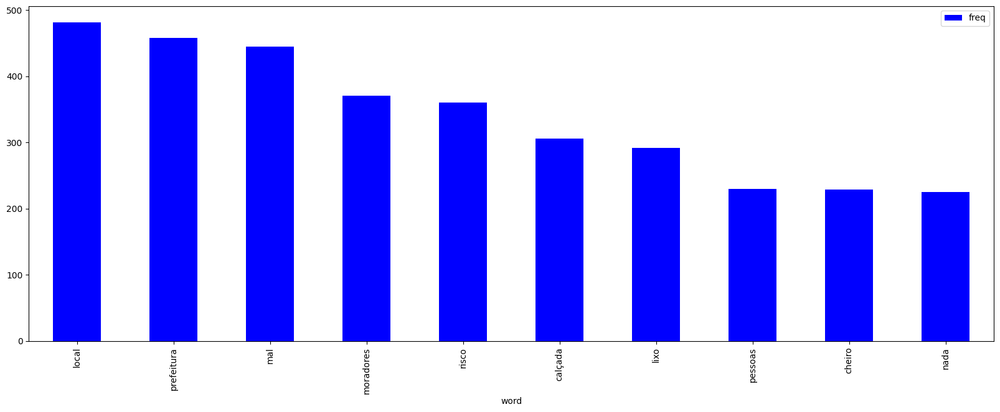

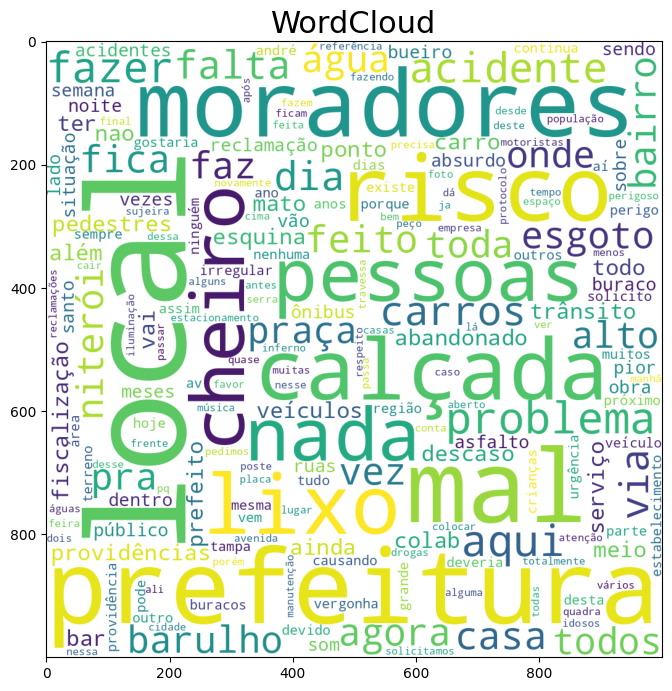

In [ ]:
# Visualizar a distribuição de palavras nos piores scores
visualizarDistribuicaoPalavras(worst_scores['description'], 10)

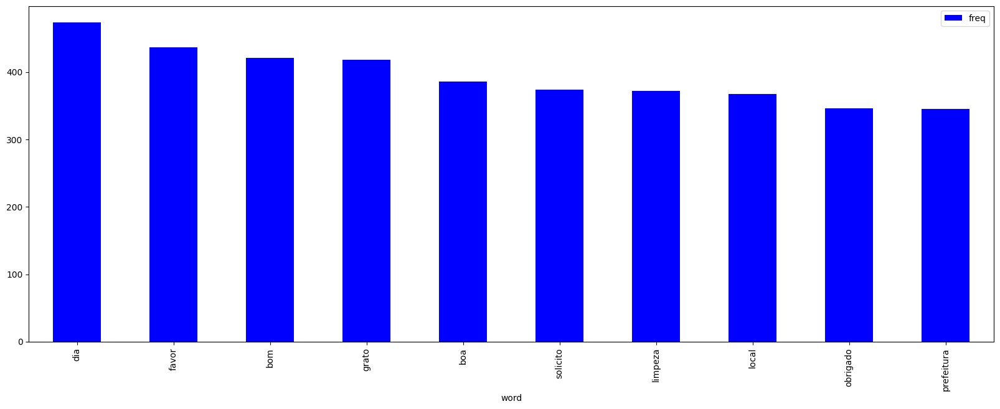

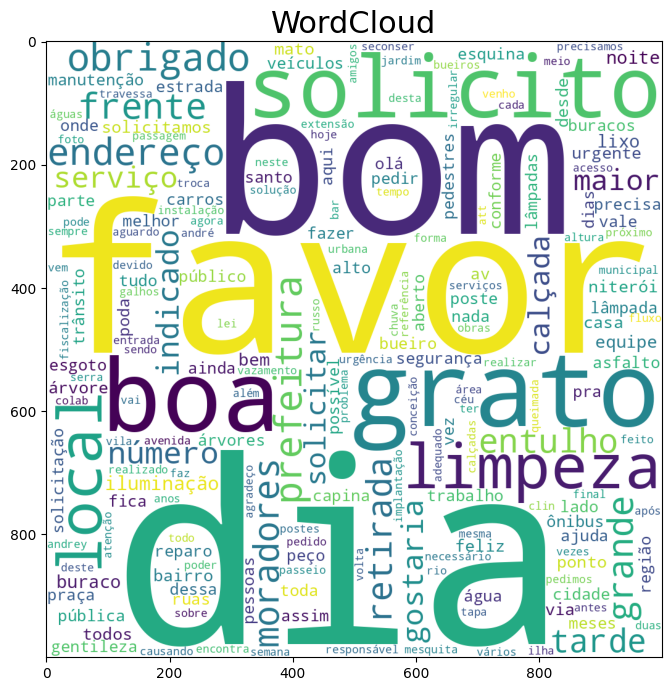

In [ ]:
# Visualizar a distribuição de palavras nos melhores scores
visualizarDistribuicaoPalavras(best_scores['description'], 10)

# Aggregate user's score

In [ ]:
agg_data = dataset.groupby('colab_user_id').agg(
    number_of_posts=pd.NamedAgg(column='colab_user_id', aggfunc='size'),
    average_score=pd.NamedAgg(column='normalized_score', aggfunc='mean'),
    compound_score=pd.NamedAgg(column='compound_score', aggfunc='mean'),
    average_leia_pos=pd.NamedAgg(column='leia_pos', aggfunc='mean'),
    average_leia_neg=pd.NamedAgg(column='leia_neg', aggfunc='mean'),
    average_leia_neu=pd.NamedAgg(column='leia_neu', aggfunc='mean')
).reset_index()
agg_data

,colab_user_id,number_of_posts,average_score,compound_score,average_leia_pos,average_leia_neg,average_leia_neu
0,2,19,-0.276421,-0.239895,0.077421,0.135737,0.786895
1,86,49,-0.345776,-0.185286,0.055000,0.114143,0.830878
2,5384,7,-0.176143,-0.340000,0.033143,0.111286,0.855714
3,6734,1,0.116000,-0.399000,0.000000,0.181000,0.819000
4,7259,2,-0.450000,-0.312000,0.000000,0.210000,0.790000
...,...,...,...,...,...,...,...
4564,948054,1,0.123000,0.065000,0.154000,0.152000,0.694000
4565,958191,2,0.121500,-0.331000,0.045500,0.141000,0.813500
4566,968676,7,-0.178571,-0.244143,0.000000,0.071571,0.928429
4567,970536,10,0.119400,0.313500,0.227800,0.085300,0.687000


In [ ]:
sorted_agg_data = agg_data.sort_values(by='average_score', ascending=False)
sorted_agg_data

,colab_user_id,number_of_posts,average_score,compound_score,average_leia_pos,average_leia_neg,average_leia_neu
1746,179587,2,0.1925,0.570,0.1715,0.077,0.7515
2434,215132,1,0.1910,-0.490,0.0520,0.158,0.7900
3748,324760,1,0.1650,-0.309,0.0760,0.102,0.8220
190,43753,1,0.1650,0.260,0.1110,0.103,0.7860
3905,334873,1,0.1590,-0.481,0.0500,0.215,0.7350
...,...,...,...,...,...,...,...
4276,367774,1,-0.9000,-0.890,0.0140,0.137,0.8480
1375,159103,1,-0.9000,-0.823,0.0260,0.097,0.8780
3934,337243,1,-0.9000,-0.360,0.0000,0.000,1.0000
4273,367172,1,-0.9000,0.165,0.1860,0.069,0.7450


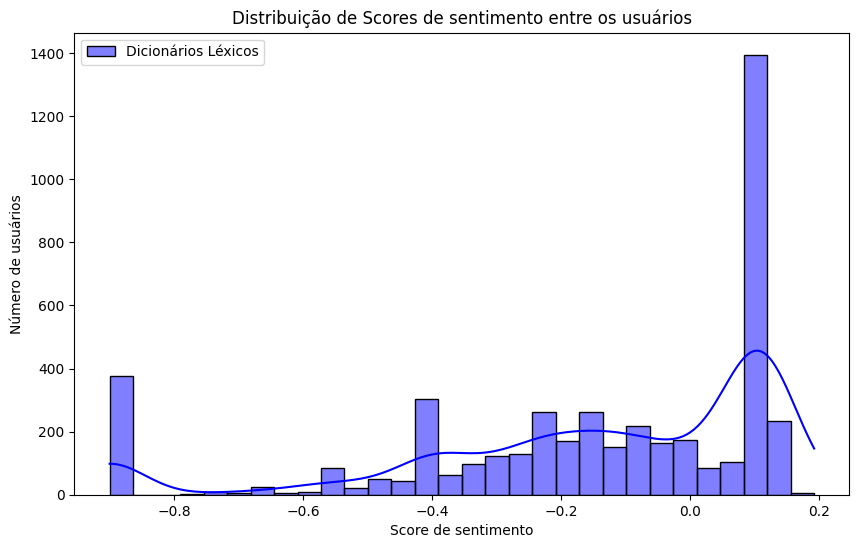

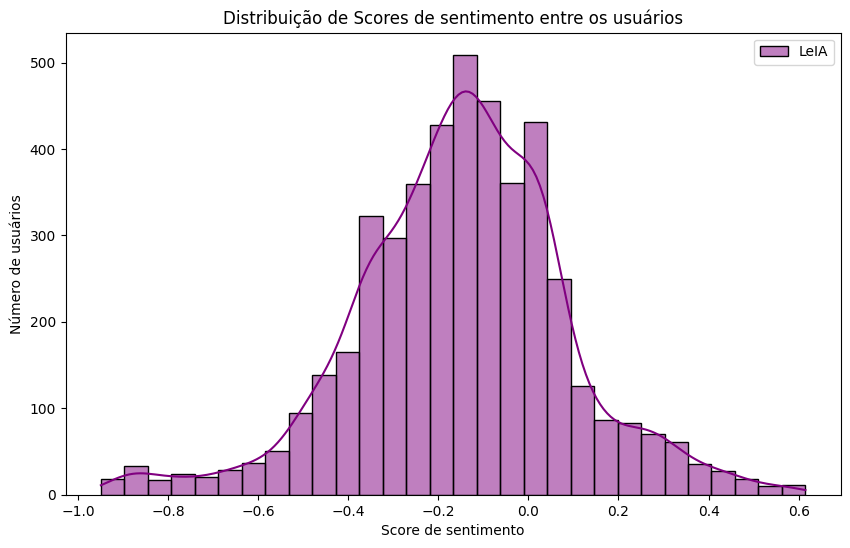

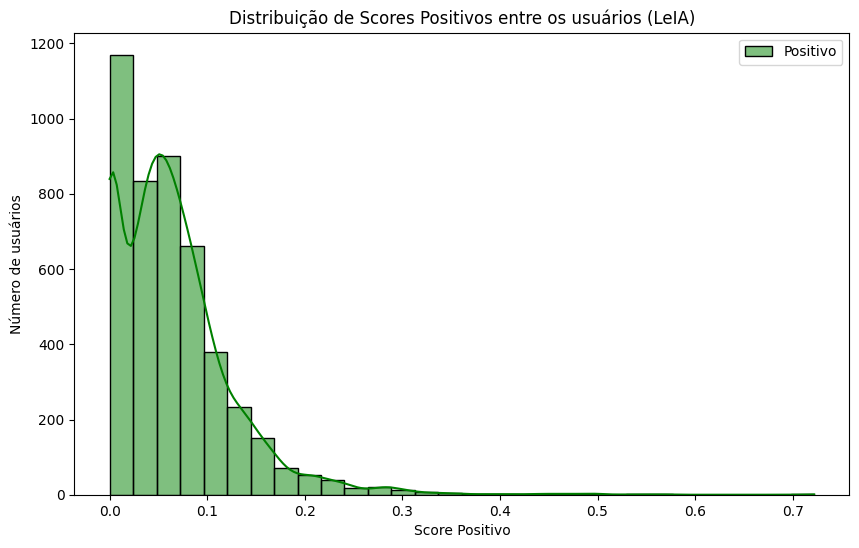

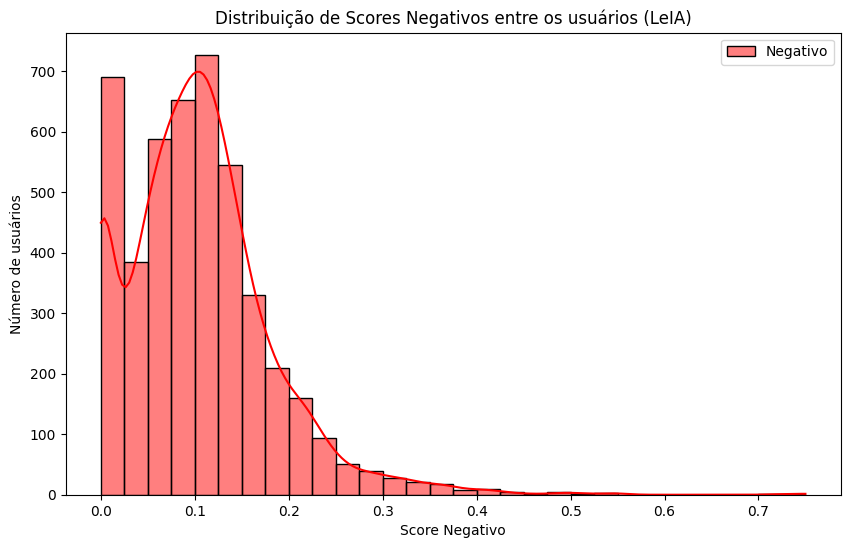

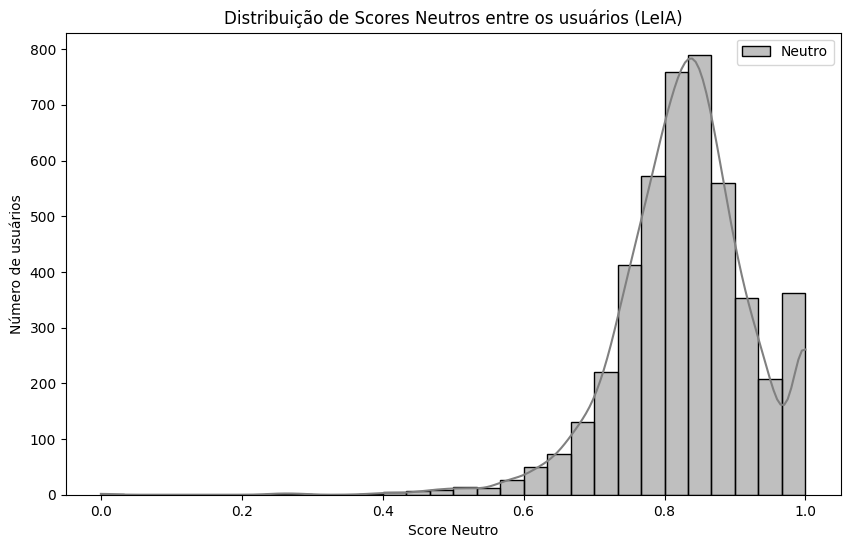

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Distribution plot (histogram) of aggregate average scores from VADER
plt.figure(figsize=(10, 6))
sns.histplot(agg_data['average_score'], bins=30, kde=True, color='blue', label='Dicionários Léxicos')
plt.title('Distribuição de Scores de sentimento entre os usuários')
plt.xlabel('Score de sentimento')
plt.ylabel('Número de usuários')
plt.legend()
plt.show()

# Distribution plot (histogram) of aggregate average scores from VADER
plt.figure(figsize=(10, 6))
sns.histplot(agg_data['compound_score'], bins=30, kde=True, color='purple', label='LeIA')
plt.title('Distribuição de Scores de sentimento entre os usuários')
plt.xlabel('Score de sentimento')
plt.ylabel('Número de usuários')
plt.legend()
plt.show()

# Distribution plot (histogram) of aggregate average positive scores from LeIA
plt.figure(figsize=(10, 6))
sns.histplot(agg_data['average_leia_pos'], bins=30, kde=True, color='green', label='Positivo')
plt.title('Distribuição de Scores Positivos entre os usuários (LeIA)')
plt.xlabel('Score Positivo')
plt.ylabel('Número de usuários')
plt.legend()
plt.show()

# Distribution plot (histogram) of aggregate average negative scores from LeIA
plt.figure(figsize=(10, 6))
sns.histplot(agg_data['average_leia_neg'], bins=30, kde=True, color='red', label='Negativo')
plt.title('Distribuição de Scores Negativos entre os usuários (LeIA)')
plt.xlabel('Score Negativo')
plt.ylabel('Número de usuários')
plt.legend()
plt.show()

# Distribution plot (histogram) of aggregate average neutral scores from LeIA
plt.figure(figsize=(10, 6))
sns.histplot(agg_data['average_leia_neu'], bins=30, kde=True, color='gray', label='Neutro')
plt.title('Distribuição de Scores Neutros entre os usuários (LeIA)')
plt.xlabel('Score Neutro')
plt.ylabel('Número de usuários')
plt.legend()
plt.show()


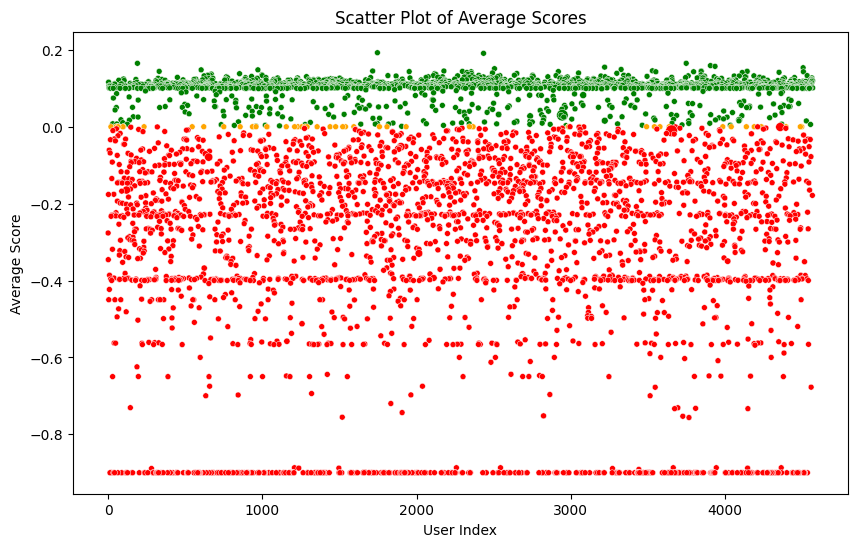

In [ ]:
# Define a function to map scores to colors
def score_to_color(score):
    if score > 0:
        return "green"
    elif score < 0:
        return "red"
    else:
        return "orange"

# Apply the function to create a new 'color' column
sorted_agg_data['color'] = sorted_agg_data['average_score'].apply(score_to_color)

# Create the scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=sorted_agg_data,
    x=sorted_agg_data.index,
    y='average_score',
    hue='color',
    size='number_of_posts',  # Use number_of_posts for marker size
    palette={"red": "red", "orange": "orange", "green": "green"},
    legend=False
)
plt.title('Scatter Plot of Average Scores')
plt.xlabel('User Index')
plt.ylabel('Average Score')
plt.show()


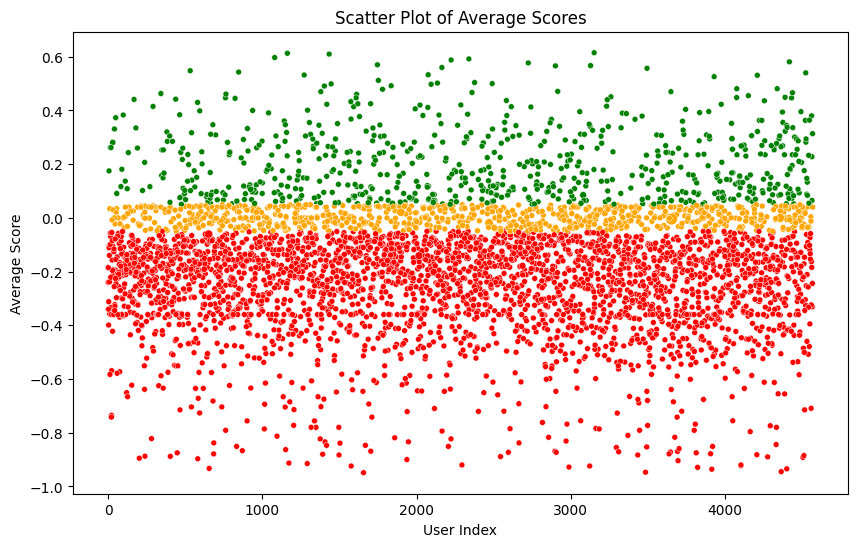

In [ ]:
def leia_score_to_color(compound_score):
    if compound_score >= 0.05:
        return "green"
    elif compound_score <= -0.05:
        return "red"
    else:
        return "orange"
####
# Apply the function to create a new 'color' column
sorted_agg_data['color'] = sorted_agg_data['compound_score'].apply(leia_score_to_color)

# Create the scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=sorted_agg_data,
    x=sorted_agg_data.index,
    y='compound_score',
    hue='color',
    size='number_of_posts',  # Use number_of_posts for marker size
    palette={"red": "red", "orange": "orange", "green": "green"},
    legend=False
)
plt.title('Scatter Plot of Average Scores')
plt.xlabel('User Index')
plt.ylabel('Average Score')
plt.show()

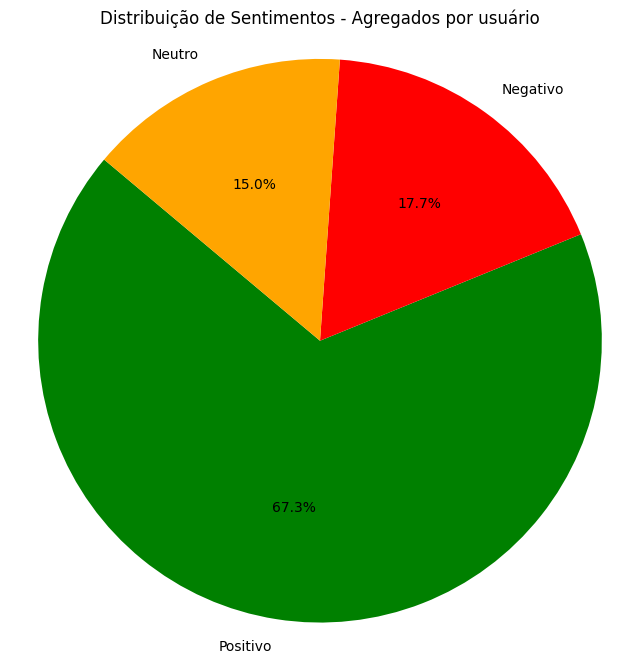

In [ ]:
# Calculate the count of each sentiment category
sentiment_counts = sorted_agg_data['color'].value_counts()

# Create a pie chart with custom labels
labels = ['Positivo', 'Negativo', 'Neutro']
colors = ['green', 'red', 'orange']

plt.figure(figsize=(8, 8))
plt.pie(sentiment_counts, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Distribuição de Sentimentos - Agregados por usuário')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

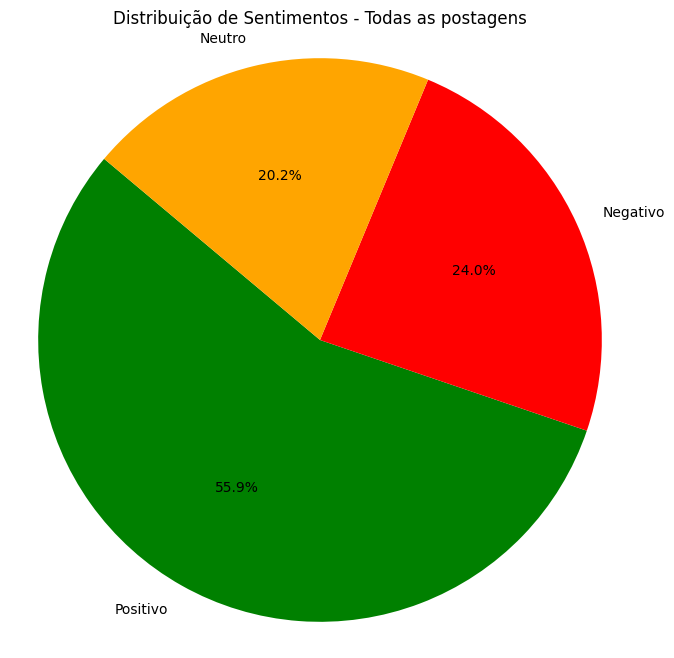

In [ ]:
# Categorização das postagens
df = dataset
df['category'] = 'neutro'
df.loc[df['leia_compound'] >= 0.05, 'category'] = 'positivo'
df.loc[df['leia_compound'] <= -0.05, 'category'] = 'negativo'

# Contagem das categorias
category_counts = df['category'].value_counts()

# Create a pie chart with custom labels
labels = ['Positivo', 'Negativo', 'Neutro']
colors = ['green', 'red', 'orange']

plt.figure(figsize=(8, 8))
plt.pie(category_counts, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Distribuição de Sentimentos - Todas as postagens')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [ ]:
# Calculate the average score for each event type
event_type_avg_scores = dataset.groupby('event_type_id')['score'].mean()

# Find the event type with the highest positive average score
most_positive_event_type_id = event_type_avg_scores.idxmax()
most_positive_avg_score = event_type_avg_scores.max()

# Find the event type with the lowest (most negative) average score
most_negative_event_type_id = event_type_avg_scores.idxmin()
most_negative_avg_score = event_type_avg_scores.min()

# Print the results
print(f"Most Positive Event Type ID: {most_positive_event_type_id}, Average Score: {most_positive_avg_score}")
print(f"Most Negative Event Type ID: {most_negative_event_type_id}, Average Score: {most_negative_avg_score}")

Most Positive Event Type ID: 3976, Average Score: 4.024
Most Negative Event Type ID: 9976, Average Score: -14.67225


Number of Posts by Gender and Sentiment:
sentiment     green  orange    red
gender                            
female         3894    3531   8207
male          22513   56011  34836
non_binary        0       1      0
not_informed     42      37    101
others          526    1356   1780


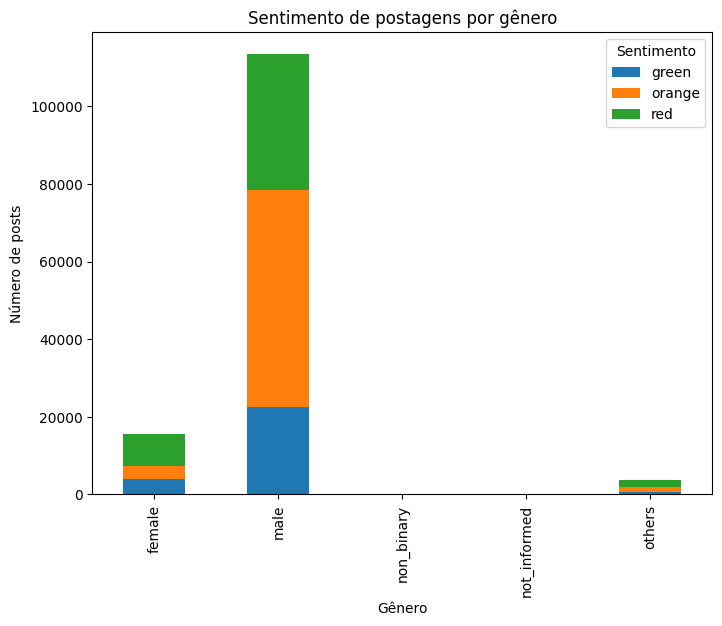

In [ ]:
# Merge the 'dataset' and 'nodes' DataFrames on 'colab_user_id'
merged_data = dataset.merge(nodes, on='colab_user_id', how='inner')
# Apply the sentiment classification to 'normalized_score' and create a 'sentiment' column
merged_data['sentiment'] = merged_data['compound_score'].apply(leia_score_to_color)
# Calculate the number of posts by gender and sentiment
gender_sentiment_counts = merged_data.groupby(['gender', 'sentiment']).size().unstack(fill_value=0)
# Print the counts
print("Number of Posts by Gender and Sentiment:")
print(gender_sentiment_counts)

# Reset the index to move 'gender' to columns
gender_sentiment_counts.reset_index(inplace=True)

# Create a stacked bar chart
gender_sentiment_counts.set_index('gender').plot(kind='bar', stacked=True, figsize=(8, 6))
plt.title('Sentimento de postagens por gênero')
plt.xlabel('Gênero')
plt.ylabel('Número de posts')
plt.legend(title='Sentimento', loc='upper right')
plt.show()

In [ ]:
agg_data.to_csv('colab_sentiment_aggregate_3_cidades.csv', encoding='utf-8-sig', index=False)

In [ ]:
# Group by 'event_type_id' and 'event_type_name' to get unique combinations
unique_event_types = merged_events.groupby(['event_type_id', 'event_type_name']).size().reset_index()

# Rename the columns for clarity
unique_event_types.columns = ['event_type_id', 'event_type_name', 'count']

# Print the result
print(unique_event_types.head())

   event_type_id                  event_type_name  count
0              1                Semáforo quebrado      3
1              2     Iluminação pública irregular      5
2              3                  Buraco nas vias    222
3              4  Foco de mosquito da dengue/zika      7
4              5                   Poda de árvore     72


In [ ]:
# Para o evento mais positivo
positive_event_name = unique_event_types.loc[unique_event_types['event_type_id'] == 3976, 'event_type_name'].values[0]
print(f"Most Positive Event Type Name: {positive_event_name}")

# Para o evento mais negativo
negative_event_name = unique_event_types.loc[unique_event_types['event_type_id'] == 9976, 'event_type_name'].values[0]
print(f"Most Negative Event Type Name: {negative_event_name}")


Most Positive Event Type Name: Má conduta de motorista ou cobrador
Most Negative Event Type Name: Comércio aberto irregularmente


In [ ]:
# Choose an event type ID for analysis
chosen_event_type_id = 9908

# Filter the DataFrame for the chosen event type ID
event_type_data = dataset[dataset['event_type_id'] == chosen_event_type_id]

# Classify the scores into positive, negative, or neutral
event_type_data['sentiment'] = event_type_data['compound_score'].apply(leia_score_to_color)

# Count the number of positive, negative, and neutral posts
sentiment_counts = event_type_data['sentiment'].value_counts()

# Print the counts
print(f"Event Type ID {chosen_event_type_id}:")
print(f"Positive Posts: {sentiment_counts['green']}")
print(f"Negative Posts: {sentiment_counts['red']}")
print(f"Neutral Posts: {sentiment_counts['orange']}")

Event Type ID 9908:
Positive Posts: 5712
Negative Posts: 3170
Neutral Posts: 35391


<ipython-input-60-bd7749ea3c29>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  event_type_data['sentiment'] = event_type_data['compound_score'].apply(leia_score_to_color)


In [ ]:
# List to store the results
event_names = []
event_ids = []
total_posts = []
positive_counts = []
negative_counts = []
neutral_counts = []

# Unique event type IDs
unique_event_ids = dataset['event_type_id'].unique()

# Iterate over each unique event type ID
for event_id in unique_event_ids:
    # Filter the DataFrame for the current event type ID and create a copy
    event_type_data = dataset[dataset['event_type_id'] == event_id].copy()

    # Classify the scores into positive, negative, or neutral
    event_type_data['sentiment'] = event_type_data['compound_score'].apply(leia_score_to_color)

    # Count the number of positive, negative, and neutral posts
    sentiment_counts = event_type_data['sentiment'].value_counts()

    # Append the results to the lists
    event_names.append(unique_event_types.loc[unique_event_types['event_type_id'] == event_id, 'event_type_name'].values[0])
    event_ids.append(event_id)
    total_posts.append(len(event_type_data))
    positive_counts.append(sentiment_counts.get('green', 0))
    negative_counts.append(sentiment_counts.get('red', 0))
    neutral_counts.append(sentiment_counts.get('orange', 0))

# Create a new DataFrame from the lists
result_df = pd.DataFrame({
    'Event Name': event_names,
    'Event ID': event_ids,
    'Total Posts': total_posts,
    'Positive Posts': positive_counts,
    'Negative Posts': negative_counts,
    'Neutral Posts': neutral_counts
})

# Print the new DataFrame
import sys

# Print the DataFrame as CSV to the screen
result_df.to_csv(sys.stdout, index=False)


Event Name,Event ID,Total Posts,Positive Posts,Negative Posts,Neutral Posts
Poda de árvore,7574,2,0,2,0
Ocupação irregular de área pública,7558,3,0,3,0
Poda de árvore,3942,12,4,4,4
Entulho na calçada/via pública,3938,25,3,13,9
Ocupação irregular de área pública,3921,4,0,4,0
Entulho na calçada/via pública,3369,2010,459,819,732
Bueiro entupido,7590,1,0,0,1
Ponto de infração de trânsito recorrente,7,44,14,16,14
Manutenção de semáforo,1749,421,75,260,86
Bueiro entupido,10911,10,0,8,2
Buraco nas vias,3,222,61,72,89
Semáforo quebrado,3326,187,50,106,31
Iluminação pública irregular,3338,117,32,54,31
Calçada irregular,3917,10,0,6,4
Ponto de infração de trânsito recorrente,3940,2,1,1,0
Fiação irregular,3934,8,2,3,3
Buraco nas vias,3959,15,1,11,3
Fiação irregular,7564,1,0,1,0
Semáforo quebrado,3918,4,0,2,2
Ponto de alagamento,7561,1,0,1,0
Ponto de infração de trânsito recorrente,7575,8,1,4,3
Calçada irregular,7546,3,0,3,0
Estabelecimento sem nota fiscal,7572,2,0,2,0
Fiação irregular,14,5,0,4,1
I

In [ ]:
unique_event_ids = events['event_type_id'].unique()

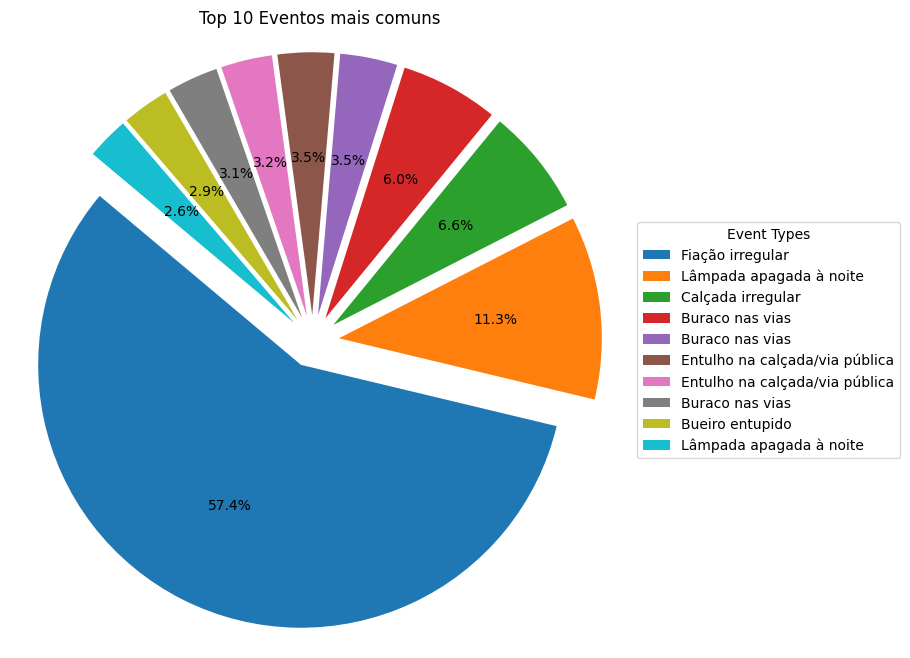

In [ ]:
# Count the occurrences of each event type ID and sort them in descending order
event_type_counts = dataset['event_type_id'].value_counts().sort_values(ascending=False)

# Select the top 10 most common event type IDs
top_10_event_types = event_type_counts.head(10)

# Get the event type names from unique_event_types
event_type_names = unique_event_types[unique_event_types['event_type_id'].isin(top_10_event_types.index)]['event_type_name'].values

# Create a pie chart without event type names as labels on the slices
plt.figure(figsize=(8, 8))

# Explode all slices
explode = [0.1] * len(top_10_event_types)

plt.pie(top_10_event_types, autopct='%1.1f%%', startangle=140, explode=explode)
plt.title('Top 10 Eventos mais comuns')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Create legend with event type names
plt.legend(event_type_names, title="Event Types", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.show()

In [ ]:
# Count the occurrences of each event type ID and sort them in descending order
event_type_counts = events['event_type_id'].value_counts().sort_values(ascending=False)

# Select the top 10 most common event type IDs
top_10_event_types = event_type_counts.head(100)

# Get the event type names from unique_event_types
event_type_names = unique_event_types[unique_event_types['event_type_id'].isin(top_10_event_types.index)]['event_type_name']

# Calculate the percentages
percentages = (top_10_event_types / top_10_event_types.sum()) * 100

# Print the event labels and their percentages
for event_name, percentage in zip(event_type_names, percentages):
    print(f"Event Name: {event_name}, Percentage: {percentage:.1f}%")

Event Name: Buraco nas vias, Percentage: 19.8%
Event Name: Poda de árvore, Percentage: 5.5%
Event Name: Bueiro entupido, Percentage: 3.1%
Event Name: Ponto de infração de trânsito recorrente, Percentage: 2.7%
Event Name: Entulho na calçada/via pública, Percentage: 2.3%
Event Name: Descarte irregular de lixo, Percentage: 2.0%
Event Name: Calçada irregular, Percentage: 1.8%
Event Name: Esgoto a céu aberto, Percentage: 1.7%
Event Name: Vazamento de água, Percentage: 1.5%
Event Name: Lâmpada apagada à noite, Percentage: 1.4%
Event Name: Mato alto, Percentage: 1.4%
Event Name: Bloqueio na via, Percentage: 1.4%
Event Name: Entulho na calçada/via pública, Percentage: 1.4%
Event Name: Lâmpada apagada à noite, Percentage: 1.3%
Event Name: Bueiro entupido, Percentage: 1.2%
Event Name: Bueiro sem tampa, Percentage: 1.2%
Event Name: Ponto de alagamento, Percentage: 1.2%
Event Name: Vazamento de água, Percentage: 1.2%
Event Name: Ocupação irregular de área pública, Percentage: 1.2%
Event Name: Pont

# Network Analysis

In [ ]:
# Criar um grafo direcionado a partir do DataFrame de arestas
filtered_nodes = nodes[nodes['colab_user_id'].isin(edges['source']) | nodes['colab_user_id'].isin(edges['target'])]
G = nx.from_pandas_edgelist(edges, source='source', target='target', create_using=nx.DiGraph())
print(G)
print(len(filtered_nodes))

DiGraph with 6904 nodes and 25785 edges
6904


In [ ]:
# Calcular a centralidade de eigenvector para cada nó
eigenvector_centralities = nx.eigenvector_centrality(G)

# Adicionar as centralidades de eigenvector ao DataFrame 'filtered_nodes'
filtered_nodes['eigenvector_centrality'] = filtered_nodes['colab_user_id'].map(eigenvector_centralities)
dataset['eigenvector_centrality'] = dataset['colab_user_id'].map(eigenvector_centralities)
filtered_nodes

<ipython-input-67-9d14f749d7de>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_nodes['eigenvector_centrality'] = filtered_nodes['colab_user_id'].map(eigenvector_centralities)


,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality
0,323968,1969-08-11,Santo André,bachelor,female,54.0,white,6.222080e-03
1,222051,1961-02-12,Santo André,primary,male,62.0,NaN,6.968046e-03
3,355872,1996-05-02,Niterói,unfinished_bachelor,female,27.0,white,3.078415e-66
9,43311,1975-06-18,Niterói,bachelor,male,48.0,white,7.759843e-04
26,236585,1959-02-07,Niterói,primary,female,64.0,white,2.428647e-02
...,...,...,...,...,...,...,...,...
56925,339868,2021-03-19,Santo André,bachelor,male,2.0,NaN,2.754230e-03
57023,467302,1997-01-30,Niterói,unfinished_bachelor,female,26.0,NaN,1.600776e-64
57251,213426,NaN,Niterói,NaN,NaN,NaN,NaN,2.864402e-05
57337,251594,NaN,Niterói,NaN,NaN,NaN,NaN,2.864402e-05


In [ ]:
@calculate_time_taken
def analyze_communities(G):
    network_communities = nx.community.greedy_modularity_communities(G)
    largest_community = max(network_communities, key=len)
    smallest_community = min(network_communities, key=len)
    avg_size = sum(len(community) for community in network_communities) / len(network_communities)
    modularity_score = nx.community.modularity(G, network_communities)
    return {
        "communities" : network_communities,
        "number_of_communities": len(network_communities),
        "largest_community_size": len(largest_community),
        "smallest_community_size": len(smallest_community),
        "average_community_size": avg_size,
        "modularity_score": modularity_score
    }
# Usage
communities_summary = analyze_communities(G)
print(f"Number of communities: {communities_summary['number_of_communities']}")
print(f"Largest community has {communities_summary['largest_community_size']} nodes.")
print(f"Smallest community has {communities_summary['smallest_community_size']} nodes.")
print(f"Average community size: {communities_summary['average_community_size']:.2f}")
print(f"Modularity score: {communities_summary['modularity_score']:.4f}")
network_communities = communities_summary["communities"]

Time taken: 54.30 seconds


Number of communities: 110
Largest community has 1674 nodes.
Smallest community has 2 nodes.
Average community size: 62.76
Modularity score: 0.6331


In [ ]:
##
min_size = 4  # or whatever minimum size you deem appropriate
network_communities = [community for community in network_communities if len(community) >= min_size]
print(f"Number of communities: {len(network_communities)}")
##
palette = get_palette_subset(Turbo256, len(network_communities))
#
@calculate_time_taken
def plot_network(G, palette, network_communities, layout) :
  plotter = NetworkPlotter3D(G, palette, network_communities, layout)
  plotter.plot(title="Comunidades - Rede 3 cidades")
##
plot_network(G, palette, network_communities, custom_3d_layout)

Number of communities: 64


Time taken: 2000.48 seconds


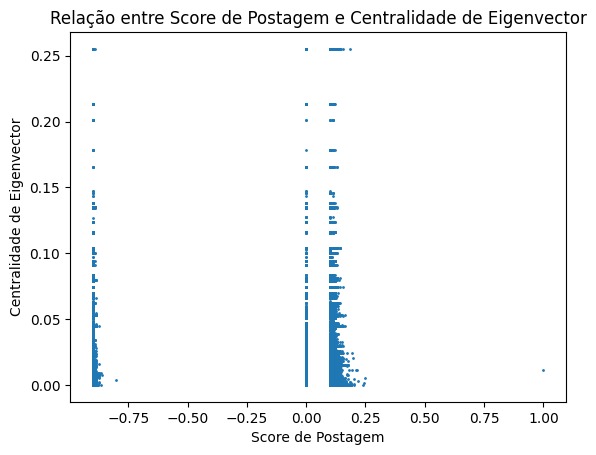

In [ ]:
# 1) Relação entre score de postagem e centralidade de eigenvector
plt.scatter(dataset['normalized_score'], dataset['eigenvector_centrality'], s=1)
plt.xlabel('Score de Postagem')
plt.ylabel('Centralidade de Eigenvector')
plt.title('Relação entre Score de Postagem e Centralidade de Eigenvector')
plt.show()

In [ ]:
# Calculate the count of posts for each user and event type
user_event_counts = dataset.groupby(['colab_user_id', 'event_type_id']).size().reset_index(name='count')
# Find the event type for which each user has the maximum count of posts
user_most_frequent_event = user_event_counts.groupby('colab_user_id')['event_type_id'].idxmax()

# Create a mapping between users and their most frequent event type
user_event_mapping = user_event_counts.loc[user_most_frequent_event]

# Create a dictionary to map users to their most frequent event type
user_to_event_type_mapping = dict(zip(user_event_mapping['colab_user_id'], user_event_mapping['event_type_id']))
filtered_nodes['event_type_id'] = filtered_nodes['colab_user_id'].map(user_to_event_type_mapping)

<ipython-input-74-df5afbf7ddbd>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Create a mapping between 'colab_user_id' and 'number_of_posts' and 'average_score'
user_to_posts_mapping = dict(zip(agg_data['colab_user_id'], agg_data['number_of_posts']))
user_to_average_score_mapping = dict(zip(agg_data['colab_user_id'], round(agg_data['average_score'],3)))
user_to_compound_score_mapping = dict(zip(agg_data['colab_user_id'], round(agg_data['compound_score'],3)))
user_to_pos_score_mapping = dict(zip(agg_data['colab_user_id'], round(agg_data['average_leia_pos'],3)))
user_to_neg_score_mapping = dict(zip(agg_data['colab_user_id'], round(agg_data['average_leia_neg'],3)))
user_to_neu_score_mapping = dict(zip(agg_data['colab_user_id'], round(agg_data['average_leia_neu'],3)))

# Add the 'number_of_posts' and 'average_score' columns to the 'nodes' DataFrame
filtered_nodes['number_of_posts'] = filtered_nodes['colab_user_id'].map(user_to_posts_mapping)
filtered_nodes['average_score'] = filtered_nodes['colab_user_id'].map(user_to_average_score_mapping)
filtered_nodes['compound_score'] = filtered_nodes['colab_user_id'].map(user_to_compound_score_mapping)
filtered_nodes['pos_score'] = filtered_nodes['colab_user_id'].map(user_to_pos_score_mapping)
filtered_nodes['neu_score'] = filtered_nodes['colab_user_id'].map(user_to_neu_score_mapping)
filtered_nodes['neg_score'] = filtered_nodes['colab_user_id'].map(user_to_neg_score_mapping)

<ipython-input-75-518f2aba66f3>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-75-518f2aba66f3>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-75-518f2aba66f3>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-75-518f

In [ ]:
# Get the unique user IDs from the nodes DataFrame
unique_user_ids_nodes = set(filtered_nodes['colab_user_id'])

unique_colab_user_ids = set(dataset['colab_user_id'].unique())

# Get the unique user IDs from the edges DataFrame (both source and target)
unique_user_ids_edges = set(edges['source']).union(set(edges['target']))

# Find the user IDs that are in the edges but not in the nodes DataFrame
missing_user_ids = unique_user_ids_edges - unique_user_ids_nodes

# Check if there are any missing user IDs
if len(missing_user_ids) > 0:
    print(f"Missing user IDs: {missing_user_ids}")
else:
    print("No missing user IDs found between nodes and edges.")
##
# Find the user IDs that are in the nodes but not in the dataset DataFrame
missing_user_ids = unique_user_ids_nodes - unique_colab_user_ids

# Check if there are any missing user IDs
if len(missing_user_ids) > 0:
    print(f"User Ids with no events: {missing_user_ids}")
else:
    print("No missing user IDs found in dataset.")

No missing user IDs found between nodes and edges.
User Ids with no events: {196613, 180235, 163872, 65579, 180271, 139327, 180288, 180296, 319561, 180300, 65616, 131152, 319568, 196713, 475243, 204911, 180335, 180349, 131228, 671907, 65704, 24745, 180394, 180399, 65712, 164021, 180407, 164028, 57532, 41154, 180423, 188629, 123096, 57561, 180445, 172256, 114914, 319721, 65772, 196848, 24817, 57587, 139508, 286967, 164094, 180480, 303365, 180488, 188681, 155916, 180493, 155929, 196891, 41243, 188699, 57630, 65824, 41249, 65826, 180520, 57645, 98608, 655668, 41270, 188726, 172346, 74048, 188741, 90442, 180557, 172375, 188766, 65887, 188768, 156005, 467302, 41319, 164200, 319846, 123242, 172395, 123244, 180590, 41327, 287093, 57728, 98690, 172420, 90503, 180624, 180625, 401811, 147859, 197025, 180642, 131493, 8613, 90534, 115122, 213426, 672196, 49606, 164301, 164302, 254424, 49634, 180706, 180711, 180712, 197102, 90606, 8688, 188917, 188921, 270845, 90626, 197127, 57866, 188943, 147985, 

In [ ]:
# Iterate through the nodes of the graph 'G' and update node information
for colab_user_id in G.nodes():
    # Check if the 'colab_user_id' exists in the 'nodes_filtered' DataFrame
    if colab_user_id in filtered_nodes.index:
        # Get the node data from 'nodes_filtered'
        node_data = filtered_nodes.loc[colab_user_id]
        # Update the node attributes in 'G' with the data from 'nodes_filtered'
        G.nodes[colab_user_id].update(node_data.to_dict())

In [ ]:
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
event_type_assortativity = nx.attribute_assortativity_coefficient(G, 'event_type_id')
print(f"Assortativity with respect to 'event_type_id': {round(event_type_assortativity,3)}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
idade_assortativity = nx.attribute_assortativity_coefficient(G, 'idade')
print(f"Assortativity with respect to 'idade': {round(idade_assortativity,3)}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
gender_assortativity = nx.attribute_assortativity_coefficient(G, 'gender')
print(f"Assortativity with respect to 'gender': {round(gender_assortativity,3)}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
education_assortativity = nx.attribute_assortativity_coefficient(G, 'education')
print(f"Assortativity with respect to 'education': {round(education_assortativity,5)}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
race_assortativity = nx.attribute_assortativity_coefficient(G, 'race')
print(f"Assortativity with respect to 'race': {round(race_assortativity,3)}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
average_score_assortativity = nx.attribute_assortativity_coefficient(G, 'average_score')
print(f"Assortativity with respect to 'average_score': {round(average_score_assortativity,5)}")
##
# Calculate the assortativity of 'G' with respect to the 'city' attribute
compound_score_assortativity = nx.attribute_assortativity_coefficient(G, 'compound_score')
print(f"Assortativity with respect to 'compound_score': {round(compound_score_assortativity,5)}")
##
# Calculate the assortativity of 'G' with respect to the 'city' attribute
pos_score_assortativity = nx.attribute_assortativity_coefficient(G, 'pos_score')
print(f"Assortativity with respect to 'pos_score_assortativity': {round(pos_score_assortativity,5)}")
##
# Calculate the assortativity of 'G' with respect to the 'city' attribute
neg_score_assortativity = nx.attribute_assortativity_coefficient(G, 'neg_score')
print(f"Assortativity with respect to 'neg_score_assortativity': {round(neg_score_assortativity,5)}")
##
# Calculate the assortativity of 'G' with respect to the 'city' attribute
neu_score_assortativity = nx.attribute_assortativity_coefficient(G, 'neu_score')
print(f"Assortativity with respect to 'neu_score_assortativity': {round(neu_score_assortativity,5)}")
##
# Calculate the assortativity of 'G' with respect to the 'city' attribute
city_assortativity = nx.attribute_assortativity_coefficient(G, 'city')
print(f"Assortativity with respect to 'city': {round(city_assortativity, 5)}")

Assortativity with respect to 'event_type_id': 0.015
Assortativity with respect to 'idade': 0.015
Assortativity with respect to 'gender': 0.025
Assortativity with respect to 'education': 0.01987
Assortativity with respect to 'race': 0.025
Assortativity with respect to 'average_score': 0.01489
Assortativity with respect to 'compound_score': 0.01489
Assortativity with respect to 'pos_score_assortativity': 0.01487
Assortativity with respect to 'neg_score_assortativity': 0.01489
Assortativity with respect to 'neu_score_assortativity': 0.01489
Assortativity with respect to 'city': 0.02506


# Data Analysis

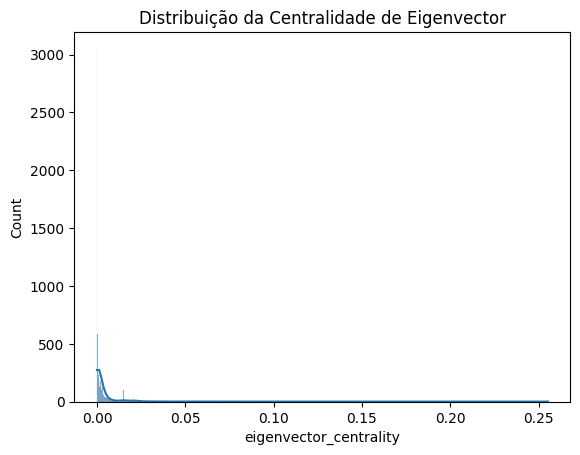

In [ ]:
##
sns.histplot(filtered_nodes['eigenvector_centrality'], kde=True)
plt.title('Distribuição da Centralidade de Eigenvector')
plt.show()
##

In [ ]:
correlation, p_value = spearmanr(dataset['score'], dataset['eigenvector_centrality'])
print(f"Correlação Spearman: {correlation:.2f}")

Correlação Spearman: -0.14


<ipython-input-234-274203199d7e>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = dataset.corr(method='spearman')


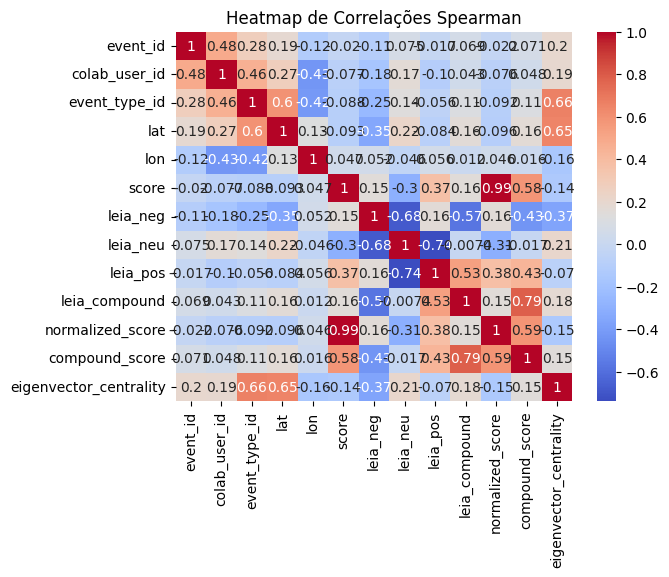

In [ ]:
##
correlation_matrix = dataset.corr(method='spearman')
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Heatmap de Correlações Spearman')
plt.show()

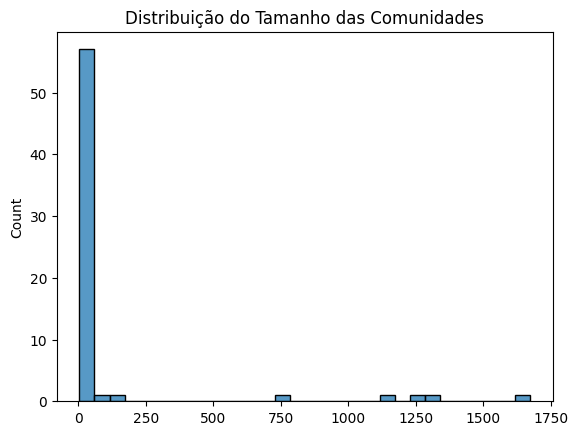

In [ ]:
##
community_sizes = [len(community) for community in network_communities]
sns.histplot(community_sizes, bins=30)
plt.title('Distribuição do Tamanho das Comunidades')
plt.show()

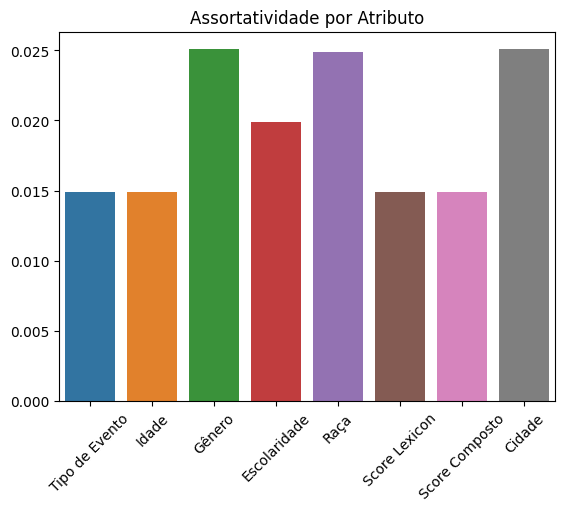

In [ ]:
##
assortativities = {
    'Tipo de Evento': event_type_assortativity,
    'Idade': idade_assortativity,
    'Gênero': gender_assortativity,
    'Escolaridade': education_assortativity,
    'Raça': race_assortativity,
    'Score Lexicon': average_score_assortativity,
    'Score Composto' : compound_score_assortativity,
    'Cidade': city_assortativity
}
sns.barplot(x=list(assortativities.keys()), y=list(assortativities.values()))
plt.title('Assortatividade por Atributo')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Get the top 10 nodes with the largest number of posts
top_10_nodes = filtered_nodes.nlargest(10, 'number_of_posts')

# Print the top 10 nodes
print("Top 10 Nodes with the Largest Number of Posts:")
print(top_10_nodes[['colab_user_id', 'number_of_posts']])

Top 10 Nodes with the Largest Number of Posts:
       colab_user_id  number_of_posts
8017          318649          12287.0
16954         240336          11609.0
7834          425243           5310.0
4246          216238           4490.0
57            186310           4185.0
75             76184           4031.0
422            43341           3621.0
3906          194422           2911.0
5497          253059           1698.0
3930          200628           1550.0


In [ ]:
eigenvector_centralities = nx.eigenvector_centrality(G)

def print_top_users_info(G, nodes, num_top_users=10):
    # Get the top nodes with the largest number of posts
    top_nodes = nodes.nlargest(num_top_users, 'number_of_posts')

    for _, node_data in top_nodes.iterrows():
        node_id = node_data['colab_user_id']

        # Get the Eigenvector centrality for the node

        eigenvector_centrality = eigenvector_centralities.get(node_id, "Node not found")

        # Get the number of followers and following for the node
        in_degree = G.in_degree(node_id)
        out_degree = G.out_degree(node_id)

        # Get the number of posts and average score from nodes DataFrame
        number_of_posts = node_data['number_of_posts']
        average_score = node_data['average_score']
        event_type_id = node_data['event_type_id']
        gender = node_data['gender']
        age = node_data['idade']
        race = node_data['race']

        # Print node information
        print(f"Node ID: {node_id}")
        print(f"Eigenvector Centrality: {eigenvector_centrality}")
        print(f"Number of Followers: {in_degree}")
        print(f"Number of Following: {out_degree}")
        print(f"Number of Posts: {number_of_posts}")
        print(f"Average Score: {average_score}")
        print(f"Gender: {gender}")
        print(f"Age: {age}")
        print(f"Race: {race}")
        print("\n")

# Example usage:
# Replace G and nodes with your graph and nodes DataFrame
print_top_users_info(G, filtered_nodes)


Node ID: 318649
Eigenvector Centrality: 0.05851388893555524
Number of Followers: 24
Number of Following: 5
Number of Posts: 12287.0
Average Score: -0.011
Gender: male
Age: 38.0
Race: nan


Node ID: 240336
Eigenvector Centrality: 0.053235117791910175
Number of Followers: 13
Number of Following: 4
Number of Posts: 11609.0
Average Score: 0.03
Gender: male
Age: 49.0
Race: brown


Node ID: 425243
Eigenvector Centrality: 0.04224679055614464
Number of Followers: 15
Number of Following: 15
Number of Posts: 5310.0
Average Score: -0.001
Gender: male
Age: 48.0
Race: brown


Node ID: 216238
Eigenvector Centrality: 0.13536324672567845
Number of Followers: 72
Number of Following: 17
Number of Posts: 4490.0
Average Score: -0.055
Gender: male
Age: 59.0
Race: brown


Node ID: 186310
Eigenvector Centrality: 0.25521410241567366
Number of Followers: 133
Number of Following: 406
Number of Posts: 4185.0
Average Score: -0.052
Gender: male
Age: 52.0
Race: black


Node ID: 76184
Eigenvector Centrality: 0.04466

<ipython-input-245-9c9b23e36368>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_nodes['number_of_posts'] = pd.to_numeric(filtered_nodes['number_of_posts'], errors='coerce')
<ipython-input-245-9c9b23e36368>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_nodes['eigenvector_centrality'].fillna(0, inplace=True)
<ipython-input-245-9c9b23e36368>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

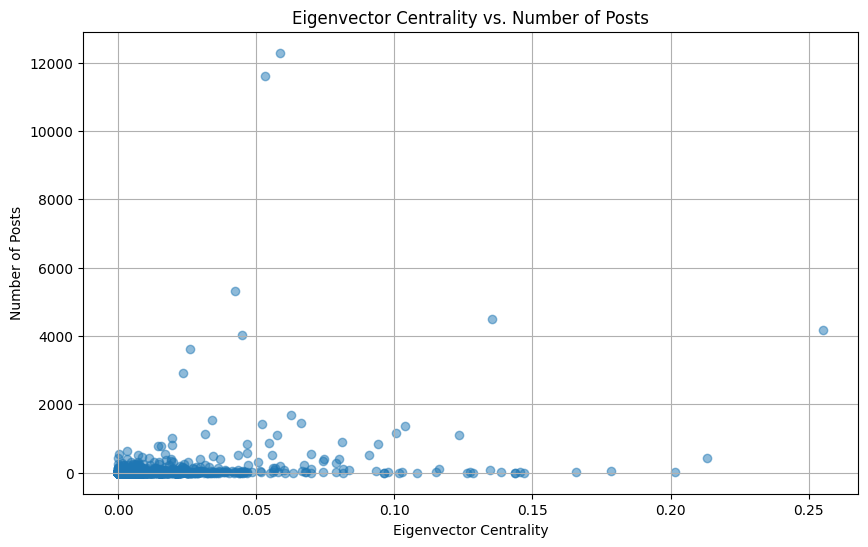

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Convert non-numeric values to NaN in the 'number_of_posts' column
filtered_nodes['number_of_posts'] = pd.to_numeric(filtered_nodes['number_of_posts'], errors='coerce')

# Replace NaN values with 0 in both columns
filtered_nodes['eigenvector_centrality'].fillna(0, inplace=True)
filtered_nodes['number_of_posts'].fillna(0, inplace=True)

# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(filtered_nodes['eigenvector_centrality'], filtered_nodes['number_of_posts'], alpha=0.5)
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Number of Posts')
plt.title('Eigenvector Centrality vs. Number of Posts')
plt.grid(True)

# Show the plot
plt.show()


# Mesquita

In [ ]:
filename = "graph-mesquita.gexf"
# Very important: If the file read doesnt work, make sure the Gephi file is on the 1.2 format.
# Load the .gexf file
G = nx.read_gexf(filename)
G = nx.DiGraph(G)
# Print basic information about the graph
print(G)
#
edges_list = list(G.edges())
# Step 2: Create a DataFrame from the edge list
edges_df = pd.DataFrame(edges_list, columns=['source', 'target'])
edges_df['source'] = edges_df['source'].astype(int)
edges_df['target'] = edges_df['target'].astype(int)
G = nx.from_pandas_edgelist(edges_df, source='source', target='target', create_using=nx.DiGraph())
print(G)
#
nodes['colab_user_id'] = nodes['colab_user_id'].astype(int)
dataset['colab_user_id'] = dataset['colab_user_id'].astype(int)
# Get a set of all unique node IDs in the edges of graph G
unique_edge_nodes = set()
for u, v in G.edges():
    unique_edge_nodes.add(u)
    unique_edge_nodes.add(v)
# Filter the nodes DataFrame to include only nodes in unique_edge_nodes
unique_edge_nodes = set(int(node_id) for node_id in unique_edge_nodes)
#print(unique_edge_nodes)
##
filtered_nodes = nodes[nodes['colab_user_id'].isin(unique_edge_nodes)]
print(len(filtered_nodes))

##
# Calcular a centralidade de eigenvector para cada nó
eigenvector_centralities = nx.eigenvector_centrality(G)

# Adicionar as centralidades de eigenvector ao DataFrame 'filtered_nodes'
filtered_dataset = dataset[dataset['colab_user_id'].isin(filtered_nodes['colab_user_id'])]
filtered_nodes['eigenvector_centrality'] = filtered_nodes['colab_user_id'].map(eigenvector_centralities)
dataset['eigenvector_centrality'] = dataset['colab_user_id'].map(eigenvector_centralities)
##
filtered_nodes

DiGraph with 718 nodes and 3208 edges
DiGraph with 699 nodes and 3208 edges
699


<ipython-input-246-4d5d32269976>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_nodes['eigenvector_centrality'] = filtered_nodes['colab_user_id'].map(eigenvector_centralities)


,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality
57,186310,1971-12-01,Mesquita,bachelor,male,52.0,black,0.263769
125,333167,1980-09-29,Mesquita,master,male,43.0,NaN,0.000091
252,345433,1965-02-05,Mesquita,bachelor,male,58.0,NaN,0.021976
262,347006,1984-09-09,Mesquita,bachelor,male,39.0,white,0.108376
304,405585,1988-05-10,Mesquita,bachelor,male,35.0,white,0.021976
...,...,...,...,...,...,...,...,...
56338,202015,1977-10-12,Mesquita,bachelor,female,46.0,NaN,0.020624
56455,215738,1968-08-04,Mesquita,secondary,male,55.0,brown,0.014196
56565,205486,1986-07-21,Mesquita,unfinished_bachelor,male,37.0,NaN,0.004743
56610,209620,1985-09-14,Mesquita,NaN,male,38.0,NaN,0.001808


In [ ]:
network_communities = nx.community.greedy_modularity_communities(G)
print(f"Number of communities: {len(network_communities)}")
##
largest_community = max(network_communities, key=len)
print(f"Largest community has {len(largest_community)} nodes.")
##
smallest_community = min(network_communities, key=len)
print(f"Smallest community has {len(smallest_community)} nodes.")
##
avg_size = sum(len(community) for community in network_communities) / len(network_communities)
print(f"Average community size: {avg_size:.2f}")
##
modularity_score = nx.community.modularity(G, network_communities)
print(f"Modularity score: {modularity_score:.4f}")
##
min_size = 3  # or whatever minimum size you deem appropriate
network_communities = [community for community in network_communities if len(community) >= min_size]
##
palette = get_palette_subset(Turbo256, len(network_communities))
print(f"Number of communities: {len(network_communities)}")
#
plotter = NetworkPlotter3D(G, palette, network_communities, custom_3d_layout)
plotter.plot(title="Comunidades - Rede Mesquita")

Number of communities: 21
Largest community has 333 nodes.
Smallest community has 2 nodes.
Average community size: 33.29
Modularity score: 0.4297
Number of communities: 13


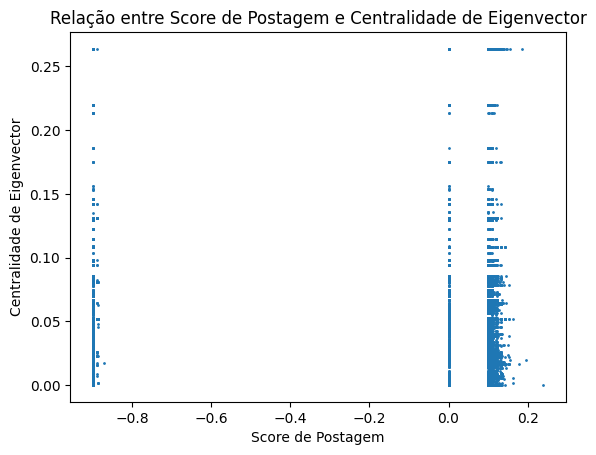

In [ ]:
# 1) Relação entre score de postagem e centralidade de eigenvector
plt.scatter(dataset['normalized_score'], dataset['eigenvector_centrality'], s=1)
plt.xlabel('Score de Postagem')
plt.ylabel('Centralidade de Eigenvector')
plt.title('Relação entre Score de Postagem e Centralidade de Eigenvector')
plt.show()

In [ ]:
# Calculate the count of posts for each user and event type
user_event_counts = dataset.groupby(['colab_user_id', 'event_type_id']).size().reset_index(name='count')
# Find the event type for which each user has the maximum count of posts
user_most_frequent_event = user_event_counts.groupby('colab_user_id')['event_type_id'].idxmax()

# Create a mapping between users and their most frequent event type
user_event_mapping = user_event_counts.loc[user_most_frequent_event]

# Create a dictionary to map users to their most frequent event type
user_to_event_type_mapping = dict(zip(user_event_mapping['colab_user_id'], user_event_mapping['event_type_id']))
filtered_nodes['event_type_id'] = filtered_nodes['colab_user_id'].map(user_to_event_type_mapping)
filtered_nodes

<ipython-input-249-6f7625bb4286>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality,event_type_id
57,186310,1971-12-01,Mesquita,bachelor,male,52.0,black,0.263769,11225.0
125,333167,1980-09-29,Mesquita,master,male,43.0,NaN,0.000091,65.0
252,345433,1965-02-05,Mesquita,bachelor,male,58.0,NaN,0.021976,9957.0
262,347006,1984-09-09,Mesquita,bachelor,male,39.0,white,0.108376,9979.0
304,405585,1988-05-10,Mesquita,bachelor,male,35.0,white,0.021976,9961.0
...,...,...,...,...,...,...,...,...,...
56338,202015,1977-10-12,Mesquita,bachelor,female,46.0,NaN,0.020624,NaN
56455,215738,1968-08-04,Mesquita,secondary,male,55.0,brown,0.014196,9978.0
56565,205486,1986-07-21,Mesquita,unfinished_bachelor,male,37.0,NaN,0.004743,NaN
56610,209620,1985-09-14,Mesquita,NaN,male,38.0,NaN,0.001808,NaN


In [ ]:
# Create a mapping between 'colab_user_id' and 'number_of_posts' and 'average_score'
user_to_posts_mapping = dict(zip(agg_data['colab_user_id'], agg_data['number_of_posts']))
user_to_average_score_mapping = dict(zip(agg_data['colab_user_id'], agg_data['average_score']))

# Add the 'number_of_posts' and 'average_score' columns to the 'nodes' DataFrame
filtered_nodes['number_of_posts'] = filtered_nodes['colab_user_id'].map(user_to_posts_mapping)
filtered_nodes['average_score'] = filtered_nodes['colab_user_id'].map(user_to_average_score_mapping)
filtered_nodes

<ipython-input-250-53773526a413>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-250-53773526a413>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality,event_type_id,number_of_posts,average_score
57,186310,1971-12-01,Mesquita,bachelor,male,52.0,black,0.263769,11225.0,4185.0,-0.051929
125,333167,1980-09-29,Mesquita,master,male,43.0,NaN,0.000091,65.0,2.0,-0.395500
252,345433,1965-02-05,Mesquita,bachelor,male,58.0,NaN,0.021976,9957.0,12.0,-0.308250
262,347006,1984-09-09,Mesquita,bachelor,male,39.0,white,0.108376,9979.0,1367.0,0.017556
304,405585,1988-05-10,Mesquita,bachelor,male,35.0,white,0.021976,9961.0,18.0,0.059278
...,...,...,...,...,...,...,...,...,...,...,...
56338,202015,1977-10-12,Mesquita,bachelor,female,46.0,NaN,0.020624,NaN,NaN,NaN
56455,215738,1968-08-04,Mesquita,secondary,male,55.0,brown,0.014196,9978.0,20.0,0.037300
56565,205486,1986-07-21,Mesquita,unfinished_bachelor,male,37.0,NaN,0.004743,NaN,NaN,NaN
56610,209620,1985-09-14,Mesquita,NaN,male,38.0,NaN,0.001808,NaN,NaN,NaN


In [ ]:
import random
# Iterate through the nodes of G
filtered_nodes["city"] = "Mesquita"
# Assuming you have 'filtered_nodes' DataFrame
# Randomly select a subset of 'colab_user_id' values (e.g., 10)
num_nodes_to_change = 1
random_nodes_to_change = random.sample(list(filtered_nodes['colab_user_id']), num_nodes_to_change)

# Modify the 'city' attribute for the selected nodes
new_city_values = ['NewCity1', 'NewCity2', 'NewCity3']  # You can define your own city values
filtered_nodes.loc[filtered_nodes['colab_user_id'].isin(random_nodes_to_change), 'city'] = np.random.choice(new_city_values, num_nodes_to_change)
for node_id in G.nodes:
    # Find the corresponding row in filtered_nodes using colab_user_id
    node_data = filtered_nodes[filtered_nodes['colab_user_id'] == node_id]

    # Check if a matching row was found
    if not node_data.empty:
        # Update the node attributes in G with the data from filtered_nodes
        node_attributes = node_data.to_dict(orient='records')[0]  # Convert to dictionary
        #print(node_attributes)
        G.nodes[node_id].update(node_attributes)
    else :
      print("not found", node_id)

<ipython-input-251-3eb96bfbfa6c>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
event_type_assortativity = nx.attribute_assortativity_coefficient(G, 'event_type_id')
print(f"Assortativity with respect to 'event_type_id': {event_type_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
idade_assortativity = nx.attribute_assortativity_coefficient(G, 'idade')
print(f"Assortativity with respect to 'idade': {idade_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
gender_assortativity = nx.attribute_assortativity_coefficient(G, 'gender')
print(f"Assortativity with respect to 'gender': {gender_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
education_assortativity = nx.attribute_assortativity_coefficient(G, 'education')
print(f"Assortativity with respect to 'education': {education_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
race_assortativity = nx.attribute_assortativity_coefficient(G, 'race')
print(f"Assortativity with respect to 'race': {race_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
average_score_assortativity = nx.attribute_assortativity_coefficient(G, 'average_score')
print(f"Assortativity with respect to 'average_score': {average_score_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'city' attribute
city_assortativity = nx.attribute_assortativity_coefficient(G, 'city')
print(f"Assortativity with respect to 'city': {city_assortativity}")

Assortativity with respect to 'event_type_id': -0.010801705615810907
Assortativity with respect to 'idade': -0.00017944635075935634
Assortativity with respect to 'gender': -0.03851940344661604
Assortativity with respect to 'education': -0.0008860204340206706
Assortativity with respect to 'race': -0.008231532339068509
Assortativity with respect to 'average_score': -0.008746977544612337
Assortativity with respect to 'city': -0.00031181789849711654


# Niterói

In [ ]:
filename = "graph-niteroi.gexf"
# Very important: If the file read doesnt work, make sure the Gephi file is on the 1.2 format.
# Load the .gexf file
G = nx.read_gexf(filename)
G = nx.DiGraph(G)
# Print basic information about the graph
print(G)
#
edges_list = list(G.edges())
# Step 2: Create a DataFrame from the edge list
edges_df = pd.DataFrame(edges_list, columns=['source', 'target'])
edges_df['source'] = edges_df['source'].astype(int)
edges_df['target'] = edges_df['target'].astype(int)
G = nx.from_pandas_edgelist(edges_df, source='source', target='target', create_using=nx.DiGraph())
print(G)
#
nodes['colab_user_id'] = nodes['colab_user_id'].astype(int)
dataset['colab_user_id'] = dataset['colab_user_id'].astype(int)
# Get a set of all unique node IDs in the edges of graph G
unique_edge_nodes = set()
for u, v in G.edges():
    unique_edge_nodes.add(u)
    unique_edge_nodes.add(v)
# Filter the nodes DataFrame to include only nodes in unique_edge_nodes
unique_edge_nodes = set(int(node_id) for node_id in unique_edge_nodes)
#print(unique_edge_nodes)
##
filtered_nodes = nodes[nodes['colab_user_id'].isin(unique_edge_nodes)]
print(len(filtered_nodes))

##
# Calcular a centralidade de eigenvector para cada nó
eigenvector_centralities = nx.eigenvector_centrality(G)

# Adicionar as centralidades de eigenvector ao DataFrame 'filtered_nodes'
filtered_dataset = dataset[dataset['colab_user_id'].isin(filtered_nodes['colab_user_id'])]
filtered_nodes['eigenvector_centrality'] = filtered_nodes['colab_user_id'].map(eigenvector_centralities)
dataset['eigenvector_centrality'] = dataset['colab_user_id'].map(eigenvector_centralities)
##
filtered_nodes

DiGraph with 1070 nodes and 4177 edges
DiGraph with 1070 nodes and 4177 edges
1070


<ipython-input-320-fd1472534201>:37: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality
71,149101,1970-12-21,Niterói,master,female,53.0,not_declared,2.272881e-03
90,933798,1973-11-01,Niterói,bachelor,male,50.0,NaN,1.901778e-12
154,235587,1986-07-26,Niterói,bachelor,female,37.0,brown,1.901778e-12
165,113374,1991-06-10,Niterói,bachelor,male,32.0,black,1.741129e-15
234,132925,1983-08-04,Niterói,bachelor,male,40.0,not_declared,5.404843e-03
...,...,...,...,...,...,...,...,...
56460,137630,1976-01-08,Niterói,NaN,male,47.0,NaN,1.474204e-05
56486,185203,1961-02-18,Niterói,bachelor,male,62.0,NaN,3.366184e-15
56505,184496,1992-03-10,Niterói,bachelor,female,31.0,NaN,7.086365e-10
56666,257781,2003-02-05,Niterói,bachelor,female,20.0,NaN,1.372083e-02


In [ ]:
network_communities = nx.community.greedy_modularity_communities(G)
print(f"Number of communities: {len(network_communities)}")
##
largest_community = max(network_communities, key=len)
print(f"Largest community has {len(largest_community)} nodes.")
##
smallest_community = min(network_communities, key=len)
print(f"Smallest community has {len(smallest_community)} nodes.")
##
avg_size = sum(len(community) for community in network_communities) / len(network_communities)
print(f"Average community size: {avg_size:.2f}")
##
modularity_score = nx.community.modularity(G, network_communities)
print(f"Modularity score: {modularity_score:.4f}")
##
min_size = 3  # or whatever minimum size you deem appropriate
network_communities = [community for community in network_communities if len(community) >= min_size]
##
palette = get_palette_subset(Turbo256, len(network_communities))
print(f"Number of communities: {len(network_communities)}")
#
plotter = NetworkPlotter3D(G, palette, network_communities, custom_3d_layout)
plotter.plot(title="Comunidades - Rede Niterói")

Number of communities: 19
Largest community has 237 nodes.
Smallest community has 2 nodes.
Average community size: 56.32
Modularity score: 0.4796
Number of communities: 16


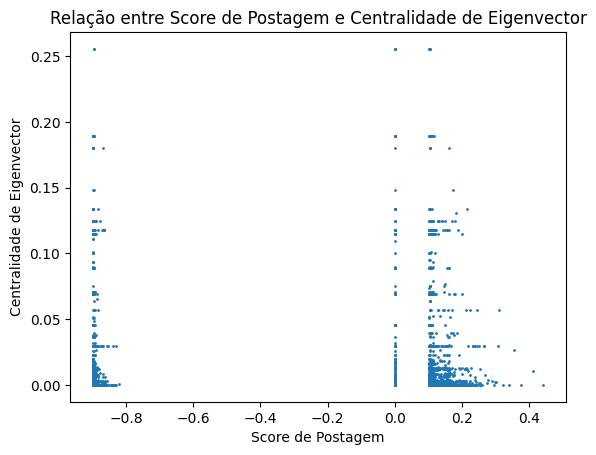

In [ ]:
# 1) Relação entre score de postagem e centralidade de eigenvector
plt.scatter(dataset['normalized_score'], dataset['eigenvector_centrality'], s=1)
plt.xlabel('Score de Postagem')
plt.ylabel('Centralidade de Eigenvector')
plt.title('Relação entre Score de Postagem e Centralidade de Eigenvector')
plt.show()

In [ ]:
# Calculate the count of posts for each user and event type
user_event_counts = dataset.groupby(['colab_user_id', 'event_type_id']).size().reset_index(name='count')
# Find the event type for which each user has the maximum count of posts
user_most_frequent_event = user_event_counts.groupby('colab_user_id')['event_type_id'].idxmax()

# Create a mapping between users and their most frequent event type
user_event_mapping = user_event_counts.loc[user_most_frequent_event]

# Create a dictionary to map users to their most frequent event type
user_to_event_type_mapping = dict(zip(user_event_mapping['colab_user_id'], user_event_mapping['event_type_id']))
filtered_nodes['event_type_id'] = filtered_nodes['colab_user_id'].map(user_to_event_type_mapping)
filtered_nodes

<ipython-input-323-6f7625bb4286>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality,event_type_id
71,149101,1970-12-21,Niterói,master,female,53.0,not_declared,2.272881e-03,1713.0
90,933798,1973-11-01,Niterói,bachelor,male,50.0,NaN,1.901778e-12,12179.0
154,235587,1986-07-26,Niterói,bachelor,female,37.0,brown,1.901778e-12,1704.0
165,113374,1991-06-10,Niterói,bachelor,male,32.0,black,1.741129e-15,1749.0
234,132925,1983-08-04,Niterói,bachelor,male,40.0,not_declared,5.404843e-03,1714.0
...,...,...,...,...,...,...,...,...,...
56460,137630,1976-01-08,Niterói,NaN,male,47.0,NaN,1.474204e-05,1699.0
56486,185203,1961-02-18,Niterói,bachelor,male,62.0,NaN,3.366184e-15,NaN
56505,184496,1992-03-10,Niterói,bachelor,female,31.0,NaN,7.086365e-10,NaN
56666,257781,2003-02-05,Niterói,bachelor,female,20.0,NaN,1.372083e-02,NaN


In [ ]:
# Create a mapping between 'colab_user_id' and 'number_of_posts' and 'average_score'
user_to_posts_mapping = dict(zip(agg_data['colab_user_id'], agg_data['number_of_posts']))
user_to_average_score_mapping = dict(zip(agg_data['colab_user_id'], agg_data['average_score']))

# Add the 'number_of_posts' and 'average_score' columns to the 'nodes' DataFrame
filtered_nodes['number_of_posts'] = filtered_nodes['colab_user_id'].map(user_to_posts_mapping)
filtered_nodes['average_score'] = filtered_nodes['colab_user_id'].map(user_to_average_score_mapping)
filtered_nodes

<ipython-input-324-53773526a413>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-324-53773526a413>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality,event_type_id,number_of_posts,average_score
71,149101,1970-12-21,Niterói,master,female,53.0,not_declared,2.272881e-03,1713.0,12.0,-0.169142
90,933798,1973-11-01,Niterói,bachelor,male,50.0,NaN,1.901778e-12,12179.0,19.0,-0.713252
154,235587,1986-07-26,Niterói,bachelor,female,37.0,brown,1.901778e-12,1704.0,6.0,-0.228532
165,113374,1991-06-10,Niterói,bachelor,male,32.0,black,1.741129e-15,1749.0,4.0,-0.666021
234,132925,1983-08-04,Niterói,bachelor,male,40.0,not_declared,5.404843e-03,1714.0,3.0,-0.223560
...,...,...,...,...,...,...,...,...,...,...,...
56460,137630,1976-01-08,Niterói,NaN,male,47.0,NaN,1.474204e-05,1699.0,2.0,-0.897535
56486,185203,1961-02-18,Niterói,bachelor,male,62.0,NaN,3.366184e-15,NaN,NaN,NaN
56505,184496,1992-03-10,Niterói,bachelor,female,31.0,NaN,7.086365e-10,NaN,NaN,NaN
56666,257781,2003-02-05,Niterói,bachelor,female,20.0,NaN,1.372083e-02,NaN,NaN,NaN


In [ ]:
import random
# Iterate through the nodes of G
filtered_nodes["city"] = "Niterói"
# Assuming you have 'filtered_nodes' DataFrame
# Randomly select a subset of 'colab_user_id' values (e.g., 10)
num_nodes_to_change = 1
random_nodes_to_change = random.sample(list(filtered_nodes['colab_user_id']), num_nodes_to_change)

# Modify the 'city' attribute for the selected nodes
new_city_values = ['1', '2', '3']
filtered_nodes.loc[filtered_nodes['colab_user_id'].isin(random_nodes_to_change), 'city'] = np.random.choice(new_city_values, num_nodes_to_change)
for node_id in G.nodes:
    # Find the corresponding row in filtered_nodes using colab_user_id
    node_data = filtered_nodes[filtered_nodes['colab_user_id'] == node_id]

    # Check if a matching row was found
    if not node_data.empty:
        # Update the node attributes in G with the data from filtered_nodes
        node_attributes = node_data.to_dict(orient='records')[0]  # Convert to dictionary
        #print(node_attributes)
        G.nodes[node_id].update(node_attributes)
    else :
      print("not found", node_id)

<ipython-input-325-61bf6a7d3cb9>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
event_type_assortativity = nx.attribute_assortativity_coefficient(G, 'event_type_id')
print(f"Assortativity with respect to 'event_type_id': {event_type_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
idade_assortativity = nx.attribute_assortativity_coefficient(G, 'idade')
print(f"Assortativity with respect to 'idade': {idade_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
gender_assortativity = nx.attribute_assortativity_coefficient(G, 'gender')
print(f"Assortativity with respect to 'gender': {gender_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
education_assortativity = nx.attribute_assortativity_coefficient(G, 'education')
print(f"Assortativity with respect to 'education': {education_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
race_assortativity = nx.attribute_assortativity_coefficient(G, 'race')
print(f"Assortativity with respect to 'race': {race_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
average_score_assortativity = nx.attribute_assortativity_coefficient(G, 'average_score')
print(f"Assortativity with respect to 'average_score': {average_score_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'city' attribute
city_assortativity = nx.attribute_assortativity_coefficient(G, 'city')
print(f"Assortativity with respect to 'city': {city_assortativity}")

Assortativity with respect to 'event_type_id': 0.0014816751899927722
Assortativity with respect to 'idade': 0.010453185529845964
Assortativity with respect to 'gender': 0.07391889267146178
Assortativity with respect to 'education': 0.05252604106140072
Assortativity with respect to 'race': 0.008320595722567074
Assortativity with respect to 'average_score': -0.0019349896130290856
Assortativity with respect to 'city': 0.0


# Santo André

In [ ]:
filename = "graph-santo-andre.gexf"
# Very important: If the file read doesnt work, make sure the Gephi file is on the 1.2 format.
# Load the .gexf file
G = nx.read_gexf(filename)
G = nx.DiGraph(G)
# Print basic information about the graph
print(G)
#
edges_list = list(G.edges())
# Step 2: Create a DataFrame from the edge list
edges_df = pd.DataFrame(edges_list, columns=['source', 'target'])
edges_df['source'] = edges_df['source'].astype(int)
edges_df['target'] = edges_df['target'].astype(int)
G = nx.from_pandas_edgelist(edges_df, source='source', target='target', create_using=nx.DiGraph())
print(G)
#
nodes['colab_user_id'] = nodes['colab_user_id'].astype(int)
dataset['colab_user_id'] = dataset['colab_user_id'].astype(int)
# Get a set of all unique node IDs in the edges of graph G
unique_edge_nodes = set()
for u, v in G.edges():
    unique_edge_nodes.add(u)
    unique_edge_nodes.add(v)
# Filter the nodes DataFrame to include only nodes in unique_edge_nodes
unique_edge_nodes = set(int(node_id) for node_id in unique_edge_nodes)
#print(unique_edge_nodes)
##
filtered_nodes = nodes[nodes['colab_user_id'].isin(unique_edge_nodes)]
print(len(filtered_nodes))

##
# Calcular a centralidade de eigenvector para cada nó
eigenvector_centralities = nx.eigenvector_centrality(G)

# Adicionar as centralidades de eigenvector ao DataFrame 'filtered_nodes'
filtered_dataset = dataset[dataset['colab_user_id'].isin(filtered_nodes['colab_user_id'])]
filtered_nodes['eigenvector_centrality'] = filtered_nodes['colab_user_id'].map(eigenvector_centralities)
dataset['eigenvector_centrality'] = dataset['colab_user_id'].map(eigenvector_centralities)
##
filtered_nodes

DiGraph with 1212 nodes and 4511 edges
DiGraph with 1199 nodes and 4511 edges
1199


<ipython-input-312-13d4d1105de9>:37: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality
0,323968,1969-08-11,Santo André,bachelor,female,54.0,white,4.757375e-02
1,222051,1961-02-12,Santo André,primary,male,62.0,NaN,3.726603e-02
27,262645,1973-07-18,Santo André,unfinished_bachelor,male,50.0,white,9.933837e-12
31,290968,1977-12-16,Santo André,bachelor,female,46.0,NaN,4.365650e-04
33,332967,1974-01-26,Santo André,unfinished_bachelor,male,49.0,black,5.545779e-02
...,...,...,...,...,...,...,...,...
56609,207412,1993-11-04,Santo André,primary,female,30.0,NaN,2.630363e-03
56796,211768,1988-10-23,Santo André,bachelor,female,35.0,NaN,1.759487e-02
56828,240177,1960-03-26,Santo André,secondary,female,63.0,NaN,1.580986e-02
56925,339868,2021-03-19,Santo André,bachelor,male,2.0,NaN,1.748846e-02


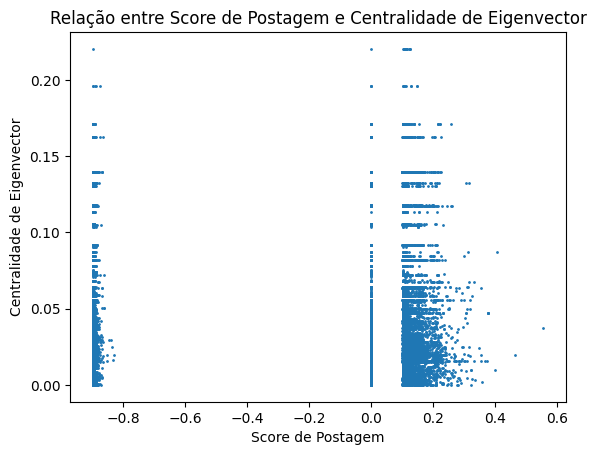

In [ ]:
# 1) Relação entre score de postagem e centralidade de eigenvector
plt.scatter(dataset['normalized_score'], dataset['eigenvector_centrality'], s=1)
plt.xlabel('Score de Postagem')
plt.ylabel('Centralidade de Eigenvector')
plt.title('Relação entre Score de Postagem e Centralidade de Eigenvector')
plt.show()

In [ ]:
# Calculate the count of posts for each user and event type
user_event_counts = dataset.groupby(['colab_user_id', 'event_type_id']).size().reset_index(name='count')
# Find the event type for which each user has the maximum count of posts
user_most_frequent_event = user_event_counts.groupby('colab_user_id')['event_type_id'].idxmax()

# Create a mapping between users and their most frequent event type
user_event_mapping = user_event_counts.loc[user_most_frequent_event]

# Create a dictionary to map users to their most frequent event type
user_to_event_type_mapping = dict(zip(user_event_mapping['colab_user_id'], user_event_mapping['event_type_id']))
filtered_nodes['event_type_id'] = filtered_nodes['colab_user_id'].map(user_to_event_type_mapping)
filtered_nodes

<ipython-input-313-6f7625bb4286>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality,event_type_id
0,323968,1969-08-11,Santo André,bachelor,female,54.0,white,4.757375e-02,3380.0
1,222051,1961-02-12,Santo André,primary,male,62.0,NaN,3.726603e-02,3374.0
27,262645,1973-07-18,Santo André,unfinished_bachelor,male,50.0,white,9.933837e-12,3353.0
31,290968,1977-12-16,Santo André,bachelor,female,46.0,NaN,4.365650e-04,3353.0
33,332967,1974-01-26,Santo André,unfinished_bachelor,male,49.0,black,5.545779e-02,3381.0
...,...,...,...,...,...,...,...,...,...
56609,207412,1993-11-04,Santo André,primary,female,30.0,NaN,2.630363e-03,NaN
56796,211768,1988-10-23,Santo André,bachelor,female,35.0,NaN,1.759487e-02,NaN
56828,240177,1960-03-26,Santo André,secondary,female,63.0,NaN,1.580986e-02,NaN
56925,339868,2021-03-19,Santo André,bachelor,male,2.0,NaN,1.748846e-02,NaN


In [ ]:
# Create a mapping between 'colab_user_id' and 'number_of_posts' and 'average_score'
user_to_posts_mapping = dict(zip(agg_data['colab_user_id'], agg_data['number_of_posts']))
user_to_average_score_mapping = dict(zip(agg_data['colab_user_id'], agg_data['average_score']))

# Add the 'number_of_posts' and 'average_score' columns to the 'nodes' DataFrame
filtered_nodes['number_of_posts'] = filtered_nodes['colab_user_id'].map(user_to_posts_mapping)
filtered_nodes['average_score'] = filtered_nodes['colab_user_id'].map(user_to_average_score_mapping)
filtered_nodes

<ipython-input-314-53773526a413>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-314-53773526a413>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality,event_type_id,number_of_posts,average_score
0,323968,1969-08-11,Santo André,bachelor,female,54.0,white,4.757375e-02,3380.0,20.0,-0.404053
1,222051,1961-02-12,Santo André,primary,male,62.0,NaN,3.726603e-02,3374.0,94.0,-0.135769
27,262645,1973-07-18,Santo André,unfinished_bachelor,male,50.0,white,9.933837e-12,3353.0,10.0,-0.370519
31,290968,1977-12-16,Santo André,bachelor,female,46.0,NaN,4.365650e-04,3353.0,9.0,0.180311
33,332967,1974-01-26,Santo André,unfinished_bachelor,male,49.0,black,5.545779e-02,3381.0,311.0,-0.229544
...,...,...,...,...,...,...,...,...,...,...,...
56609,207412,1993-11-04,Santo André,primary,female,30.0,NaN,2.630363e-03,NaN,NaN,NaN
56796,211768,1988-10-23,Santo André,bachelor,female,35.0,NaN,1.759487e-02,NaN,NaN,NaN
56828,240177,1960-03-26,Santo André,secondary,female,63.0,NaN,1.580986e-02,NaN,NaN,NaN
56925,339868,2021-03-19,Santo André,bachelor,male,2.0,NaN,1.748846e-02,NaN,NaN,NaN


In [ ]:
import random
# Iterate through the nodes of G
filtered_nodes["city"] = "Santo Andre"
# Assuming you have 'filtered_nodes' DataFrame
# Randomly select a subset of 'colab_user_id' values (e.g., 10)
num_nodes_to_change = 1
random_nodes_to_change = random.sample(list(filtered_nodes['colab_user_id']), num_nodes_to_change)

# Modify the 'city' attribute for the selected nodes
new_city_values = ['1', '2', '3']
filtered_nodes.loc[filtered_nodes['colab_user_id'].isin(random_nodes_to_change), 'city'] = np.random.choice(new_city_values, num_nodes_to_change)
for node_id in G.nodes:
    # Find the corresponding row in filtered_nodes using colab_user_id
    node_data = filtered_nodes[filtered_nodes['colab_user_id'] == node_id]

    # Check if a matching row was found
    if not node_data.empty:
        # Update the node attributes in G with the data from filtered_nodes
        node_attributes = node_data.to_dict(orient='records')[0]  # Convert to dictionary
        #print(node_attributes)
        G.nodes[node_id].update(node_attributes)
    else :
      print("not found", node_id)

<ipython-input-317-fe48a8839cbc>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
event_type_assortativity = nx.attribute_assortativity_coefficient(G, 'event_type_id')
print(f"Assortativity with respect to 'event_type_id': {event_type_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
idade_assortativity = nx.attribute_assortativity_coefficient(G, 'idade')
print(f"Assortativity with respect to 'idade': {idade_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
gender_assortativity = nx.attribute_assortativity_coefficient(G, 'gender')
print(f"Assortativity with respect to 'gender': {gender_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
education_assortativity = nx.attribute_assortativity_coefficient(G, 'education')
print(f"Assortativity with respect to 'education': {education_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
race_assortativity = nx.attribute_assortativity_coefficient(G, 'race')
print(f"Assortativity with respect to 'race': {race_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
average_score_assortativity = nx.attribute_assortativity_coefficient(G, 'average_score')
print(f"Assortativity with respect to 'average_score': {average_score_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'city' attribute
city_assortativity = nx.attribute_assortativity_coefficient(G, 'city')
print(f"Assortativity with respect to 'city': {city_assortativity}")

Assortativity with respect to 'event_type_id': 0.010773152506321696
Assortativity with respect to 'idade': -0.0021392681086569968
Assortativity with respect to 'gender': -0.020542554836607465
Assortativity with respect to 'education': -0.002030332681017719
Assortativity with respect to 'race': 0.07569238004064413
Assortativity with respect to 'average_score': -0.005161269162053967
Assortativity with respect to 'city': 0.0


In [ ]:
network_communities = nx.community.greedy_modularity_communities(G)
print(f"Number of communities: {len(network_communities)}")
##
largest_community = max(network_communities, key=len)
print(f"Largest community has {len(largest_community)} nodes.")
##
smallest_community = min(network_communities, key=len)
print(f"Smallest community has {len(smallest_community)} nodes.")
##
avg_size = sum(len(community) for community in network_communities) / len(network_communities)
print(f"Average community size: {avg_size:.2f}")
##
modularity_score = nx.community.modularity(G, network_communities)
print(f"Modularity score: {modularity_score:.4f}")
##
min_size = 3  # or whatever minimum size you deem appropriate
network_communities = [community for community in network_communities if len(community) >= min_size]
##
palette = get_palette_subset(Turbo256, len(network_communities))
print(f"Number of communities: {len(network_communities)}")

Number of communities: 23
Largest community has 202 nodes.
Smallest community has 2 nodes.
Average community size: 52.13
Modularity score: 0.5056
Number of communities: 21


In [ ]:
plotter = NetworkPlotter3D(G, palette, network_communities, custom_3d_layout)
plotter.plot(title="Comunidades - Rede Santo André")